<a href="https://colab.research.google.com/github/palanisamynavitha450-tech/navitha/blob/main/Copy_of_Heart_Disease_Prediction_Using_CatBoost_and_SHAP.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install catboost

In [ ]:
!pip install shap

In [ ]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

import shap
import xgboost

from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_validate

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import roc_auc_score, roc_curve
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import classification_report

import warnings
warnings.filterwarnings('ignore')

seed = 77

In [ ]:
data = pd.read_csv('CAD.csv')
data.head()

,Age,Weight,Length,Sex,BMI,DM,HTN,Current Smoker,EX-Smoker,FH,...,K,Na,WBC,Lymph,Neut,PLT,EF-TTE,Region RWMA,VHD,Cath
0,53,90,175,Male,29.387755,0,1,1,0,0,...,4.7,141,5700,39,52,261,50,0,N,Cad
1,67,70,157,Fmale,28.398718,0,1,0,0,0,...,4.7,156,7700,38,55,165,40,4,N,Cad
2,54,54,164,Male,20.077335,0,0,1,0,0,...,4.7,139,7400,38,60,230,40,2,mild,Cad
3,66,67,158,Fmale,26.838648,0,1,0,0,0,...,4.4,142,13000,18,72,742,55,0,Severe,Normal
4,50,87,153,Fmale,37.165193,0,1,0,0,0,...,4.0,140,9200,55,39,274,50,0,Severe,Normal


## Check Missing Value

In [ ]:
total = data.isnull().sum().sort_values(ascending=False)
percent = (data.isnull().sum() / data.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent*100], axis=1, keys=["Total", "Percent(%)"])
missing_data

,Total,Percent(%)
Age,0,0.0
Weight,0,0.0
Length,0,0.0
Sex,0,0.0
BMI,0,0.0
DM,0,0.0
HTN,0,0.0
Current Smoker,0,0.0
EX-Smoker,0,0.0
FH,0,0.0


## Check Duplicates

In [ ]:
duplicates = data[data.duplicated()]
print("Total Duplicates rows observed:", duplicates.shape[0])
print("Dropping duplicates")

# Dropping duplicates
print("Shape before dropping duplicates: ", data.shape[0])
data.drop_duplicates(inplace=True)
print("Shae after dropping duplicates: ", data.shape[0])

Total Duplicates rows observed: 0
Dropping duplicates
Shape before dropping duplicates:  303
Shae after dropping duplicates:  303


## Check Unique Values

In [ ]:
# Numerical variables:
num_cols = ['Age','Weight', 'Length','BMI', 'BP', 'PR', 'FBS', 'CR', 'TG', 'LDL', 'HDL', 'BUN', 'ESR', 'HB', 'K', 'Na', 'WBC', 'Lymph', 'Neut', 'PLT', 'EF-TTE']

# Categorical variables:
cat_cols = ['Sex', 'DM', 'HTN', 'Current Smoker', 'EX-Smoker', 'FH', 'Obesity', 'CRF', 'CVA', 'Airway disease', 'Thyroid Disease', 'CHF', 'DLP', 'Edema', 'Weak Peripheral Pulse', 'Lung rales', 'Systolic Murmur', 'Diastolic Murmur', 'Typical Chest Pain', 'Dyspnea', 'Atypical', 'Nonanginal', 'Exertional CP', 'LowTH Ang', 'Q Wave', 'St Elevation', 'St Depression', 'Tinversion', 'LVH', 'Poor R Progression', 'Cath']

# Ordinal variables
ord_cols = ['Function Class', "Region RWMA", "VHD"]

print(f"[Unique Values in {len(cat_cols)} Categorical Variables]\n")

for cat_col in cat_cols:
    print("* {} : {} Unique Values =>".format(cat_col, data[cat_col].nunique()), data[cat_col].unique())

[Unique Values in 31 Categorical Variables]

* Sex : 2 Unique Values => ['Male' 'Fmale']
* DM : 2 Unique Values => [0 1]
* HTN : 2 Unique Values => [1 0]
* Current Smoker : 2 Unique Values => [1 0]
* EX-Smoker : 2 Unique Values => [0 1]
* FH : 2 Unique Values => [0 1]
* Obesity : 2 Unique Values => ['Y' 'N']
* CRF : 2 Unique Values => ['N' 'Y']
* CVA : 2 Unique Values => ['N' 'Y']
* Airway disease : 2 Unique Values => ['N' 'Y']
* Thyroid Disease : 2 Unique Values => ['N' 'Y']
* CHF : 2 Unique Values => ['N' 'Y']
* DLP : 2 Unique Values => ['Y' 'N']
* Edema : 2 Unique Values => [0 1]
* Weak Peripheral Pulse : 2 Unique Values => ['N' 'Y']
* Lung rales : 2 Unique Values => ['N' 'Y']
* Systolic Murmur : 2 Unique Values => ['N' 'Y']
* Diastolic Murmur : 2 Unique Values => ['N' 'Y']
* Typical Chest Pain : 2 Unique Values => [0 1]
* Dyspnea : 2 Unique Values => ['N' 'Y']
* Atypical : 2 Unique Values => ['N' 'Y']
* Nonanginal : 2 Unique Values => ['N' 'Y']
* Exertional CP : 1 Unique Values => 

In [ ]:
print(f"[Unique Values in {len(ord_cols)} Ordinal Variables]\n")

for ord_col in ord_cols:
    print("* {} : {} Unique Values =>".format(ord_col, data[ord_col].nunique()), data[ord_col].unique())

[Unique Values in 3 Ordinal Variables]

* Function Class : 4 Unique Values => [0 3 2 1]
* Region RWMA : 5 Unique Values => [0 4 2 3 1]
* VHD : 4 Unique Values => ['N' 'mild' 'Severe' 'Moderate']


In [ ]:
print(f"[Unique Values in {len(num_cols)} Numerical Variables]\n")

for num_col in num_cols:
    print("* {} : {} Unique Values".format(num_col, data[num_col].nunique()))

[Unique Values in 21 Numerical Variables]

* Age : 46 Unique Values
* Weight : 54 Unique Values
* Length : 44 Unique Values
* BMI : 262 Unique Values
* BP : 17 Unique Values
* PR : 21 Unique Values
* FBS : 113 Unique Values
* CR : 18 Unique Values
* TG : 147 Unique Values
* LDL : 110 Unique Values
* HDL : 47 Unique Values
* BUN : 33 Unique Values
* ESR : 58 Unique Values
* HB : 66 Unique Values
* K : 27 Unique Values
* Na : 25 Unique Values
* WBC : 78 Unique Values
* Lymph : 50 Unique Values
* Neut : 52 Unique Values
* PLT : 135 Unique Values
* EF-TTE : 11 Unique Values


## Data Shape

In [ ]:
print(f"Dataset : {data.shape[0]} rows X {data.shape[1]} columns")

Dataset : 303 rows X 55 columns


## Data Statistics

In [ ]:
data[num_cols[:10]].describe(percentiles=[0.1, 0.25, 0.75, 0.9, 0.95])

,Age,Weight,Length,BMI,BP,PR,FBS,CR,TG,LDL
count,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000
mean,58.897690,73.831683,164.716172,27.248339,129.554455,75.141914,119.184818,1.055611,150.343234,104.643564
std,10.392278,11.987358,9.327661,4.098865,18.938105,8.911801,52.079653,0.264296,97.959451,35.396688
min,30.000000,48.000000,140.000000,18.115413,90.000000,50.000000,62.000000,0.500000,37.000000,18.000000
10%,47.000000,60.000000,152.000000,22.338318,110.000000,70.000000,80.000000,0.800000,76.000000,65.200000
25%,51.000000,65.000000,158.000000,24.514380,120.000000,70.000000,88.500000,0.900000,90.000000,80.000000
50%,58.000000,74.000000,165.000000,26.775510,130.000000,70.000000,98.000000,1.000000,122.000000,100.000000
75%,66.000000,81.000000,171.000000,29.411765,140.000000,80.000000,130.000000,1.200000,177.000000,122.000000
90%,73.000000,89.000000,176.000000,33.105234,160.000000,85.800000,191.800000,1.400000,250.000000,152.800000
95%,76.000000,93.900000,179.000000,34.805948,160.000000,90.000000,218.900000,1.500000,308.600000,169.800000


In [ ]:
data[num_cols[10:]].describe(percentiles=[0.1, 0.25, 0.75, 0.9, 0.95])

,HDL,BUN,ESR,HB,K,Na,WBC,Lymph,Neut,PLT,EF-TTE
count,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000
mean,40.233993,17.501650,19.462046,13.153465,4.230693,140.996700,7562.046205,32.399340,60.148515,221.488449,47.231023
std,10.559077,6.956761,15.936475,1.610452,0.458202,3.807885,2413.739323,9.972592,10.182493,60.796199,8.927194
min,15.900000,6.000000,1.000000,8.900000,3.000000,128.000000,3700.000000,7.000000,32.000000,25.000000,15.000000
10%,28.000000,11.000000,4.000000,11.000000,3.700000,137.000000,5100.000000,19.000000,49.000000,170.000000,35.000000
25%,33.500000,13.000000,9.000000,12.200000,3.900000,139.000000,5800.000000,26.000000,52.500000,183.500000,45.000000
50%,39.000000,16.000000,15.000000,13.200000,4.200000,141.000000,7100.000000,32.000000,60.000000,210.000000,50.000000
75%,45.500000,20.000000,26.000000,14.200000,4.500000,143.000000,8800.000000,39.000000,67.000000,250.000000,55.000000
90%,52.800000,25.000000,41.000000,15.080000,4.800000,145.000000,10400.000000,44.000000,72.800000,292.800000,55.000000
95%,55.000000,31.000000,51.000000,15.600000,4.990000,146.900000,12100.000000,49.000000,78.000000,330.000000,55.000000


## Mapping some of the column values

In [ ]:
vhd = {"N": 0, "mild": 1, "Moderate": 2, "Severe": 3}
sex = {"Male": "Male", "Fmale": "Female"}

data['VHD'] = data['VHD'].map(vhd)
data['Sex'] = data['Sex'].map(sex)

data.replace('N', 0, inplace=True)
data.replace('Y', 1, inplace=True)

In [ ]:
print(f"[Unique Values in {len(cat_cols)} Categorical Variables]\n")

for cat_col in cat_cols:
    print("* {} : {} Unique Values =>".format(cat_col, data[cat_col].nunique()), data[cat_col].unique())

[Unique Values in 31 Categorical Variables]

* Sex : 2 Unique Values => ['Male' 'Female']
* DM : 2 Unique Values => [0 1]
* HTN : 2 Unique Values => [1 0]
* Current Smoker : 2 Unique Values => [1 0]
* EX-Smoker : 2 Unique Values => [0 1]
* FH : 2 Unique Values => [0 1]
* Obesity : 2 Unique Values => [1 0]
* CRF : 2 Unique Values => [0 1]
* CVA : 2 Unique Values => [0 1]
* Airway disease : 2 Unique Values => [0 1]
* Thyroid Disease : 2 Unique Values => [0 1]
* CHF : 2 Unique Values => [0 1]
* DLP : 2 Unique Values => [1 0]
* Edema : 2 Unique Values => [0 1]
* Weak Peripheral Pulse : 2 Unique Values => [0 1]
* Lung rales : 2 Unique Values => [0 1]
* Systolic Murmur : 2 Unique Values => [0 1]
* Diastolic Murmur : 2 Unique Values => [0 1]
* Typical Chest Pain : 2 Unique Values => [0 1]
* Dyspnea : 2 Unique Values => [0 1]
* Atypical : 2 Unique Values => [0 1]
* Nonanginal : 2 Unique Values => [0 1]
* Exertional CP : 1 Unique Values => [0]
* LowTH Ang : 2 Unique Values => [0 1]
* Q Wave : 2

In [ ]:
print(f"[Unique Values in {len(ord_cols)} Ordinal Variables]\n")

for ord_col in ord_cols:
    print("* {} : {} Unique Values =>".format(ord_col, data[ord_col].nunique()), data[ord_col].unique())

[Unique Values in 3 Ordinal Variables]

* Function Class : 4 Unique Values => [0 3 2 1]
* Region RWMA : 5 Unique Values => [0 4 2 3 1]
* VHD : 4 Unique Values => [0 1 3 2]


 Univariate Analysis

## Categorical Variables

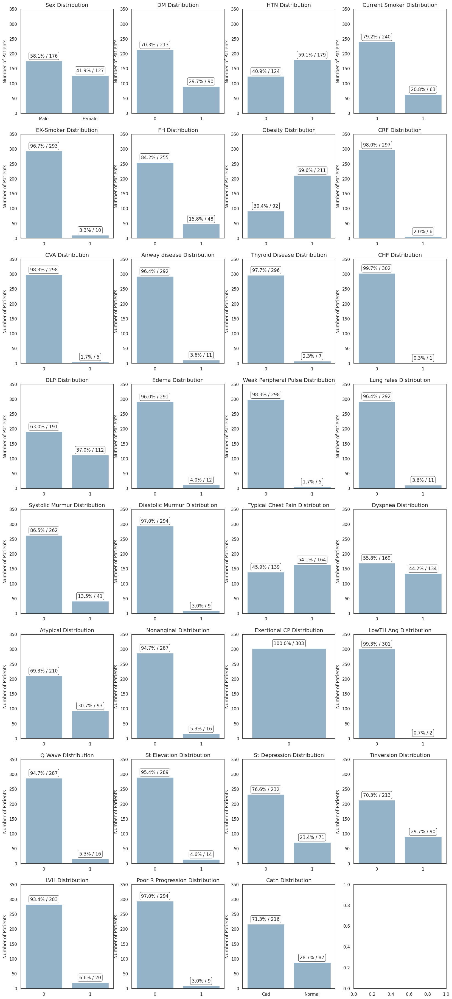

In [ ]:
n_rows, n_cols = 8, 4

fig, ax = plt.subplots(n_rows, n_cols, figsize=(20,30))

for i, cat_col in enumerate(cat_cols):
    i, j = i//n_cols, i%n_cols
    rects = sns.countplot(x=cat_col, data=data, ax=ax[i,j])

    for rect in rects.patches:
        height = rect.get_height()
        ax[i,j].text(rect.get_x()+rect.get_width()/2., height+12, "{:1.1f}% / {:d}".format(height/len(data)*100, height.astype(int)), ha='center', bbox=dict(facecolor='none', edgecolor='black', boxstyle='round', linewidth=0.5))

    ax[i,j].set_title(f'{cat_col} Distribution', fontsize=14)
    ax[i,j].set_xlabel("")
    ax[i,j].set_ylabel("Number of Patients")
    ax[i,j].set_ylim([0, 350])

fig.subplots_adjust(top=1.3)
fig.show()

## Ordinal Variables

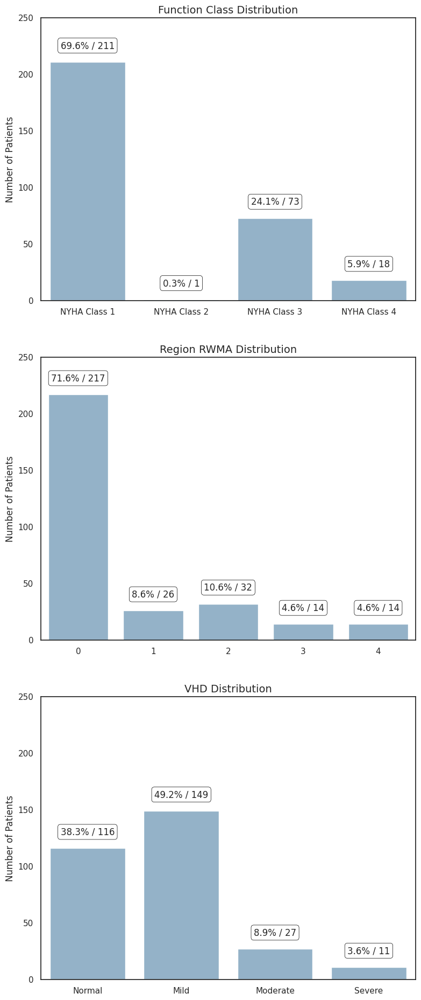

In [ ]:
n_rows, n_cols = 3, 1

fig, ax = plt.subplots(n_rows, n_cols, figsize=(9,15))

for i, ord_col in enumerate(ord_cols):
    i, j = i//n_cols, i%n_cols
    rects = sns.countplot(x=ord_col, data=data, ax=ax[i])

    for rect in rects.patches:
        height = rect.get_height()
        ax[i].text(rect.get_x()+rect.get_width()/2., height+12, "{:1.1f}% / {:d}".format(height/len(data)*100, height.astype(int)), ha='center', bbox=dict(facecolor='none', edgecolor='black', boxstyle='round', linewidth=0.5))

    ax[i].set_title(f'{ord_col} Distribution', fontsize=14)
    ax[i].set_xlabel("")
    ax[i].set_ylabel("Number of Patients")
    ax[i].set_ylim([0, 250])

ax[0].set_xticklabels(['NYHA Class 1', 'NYHA Class 2', 'NYHA Class 3', 'NYHA Class 4'])
ax[2].set_xticklabels(['Normal', 'Mild', 'Moderate', 'Severe'])

fig.subplots_adjust(top=1.3)
fig.show()

## Numerical Variables

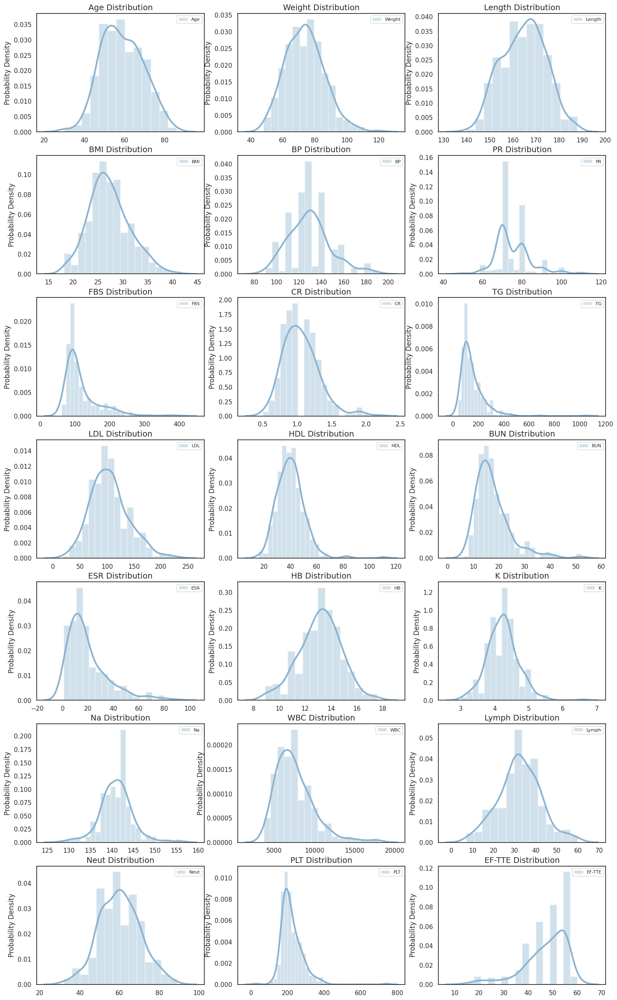

In [ ]:
n_rows, n_cols = 7, 3

fig, ax = plt.subplots(n_rows, n_cols, figsize=(18,20))

for i, num_col in enumerate(num_cols):
    i, j = i//n_cols, i%n_cols

    figure = sns.distplot(data[num_col], label=num_col, norm_hist=True, ax=ax[i,j], kde_kws={"lw":3})
    figure = figure.legend(loc='best', fontsize=8)

    ax[i,j].set_title(f'{num_col} Distribution', fontsize=14)
    ax[i,j].set_ylabel("Probability Density", fontsize="medium")
    ax[i,j].set_xlabel("")

fig.subplots_adjust(top=1.3)
fig.show()

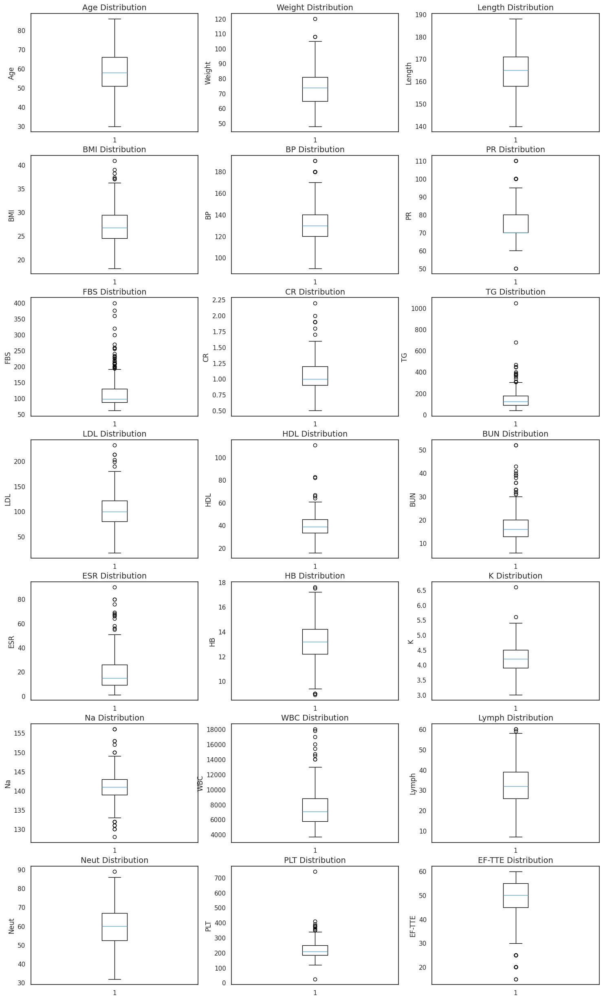

In [ ]:
n_rows, n_cols = 7, 3

fig, ax = plt.subplots(n_rows, n_cols, figsize=(18,20))

for i, num_col in enumerate(num_cols):
    i, j = i//n_cols, i%n_cols

    ax[i,j].set_title(f'{num_col} Distribution', fontsize=14)
    ax[i,j].set_ylabel(f"{num_col}", fontsize="medium")
    ax[i,j].set_xlabel("")

    ax[i,j].boxplot(data[num_col])

fig.subplots_adjust(top=1.3)
fig.show()

 Bivariate Analysis

Categorical Variables

In [ ]:
cat_cols = ['Sex', 'DM', 'HTN', 'Current Smoker', 'EX-Smoker', 'FH', 'Obesity', 'CRF', 'CVA', 'Airway disease', 'Thyroid Disease', 'CHF', 'DLP', 'Edema', 'Weak Peripheral Pulse', 'Lung rales', 'Systolic Murmur', 'Diastolic Murmur', 'Typical Chest Pain','Dyspnea', 'Atypical', 'Nonanginal', 'Exertional CP', 'LowTH Ang', 'Q Wave', 'St Elevation', 'St Depression', 'Tinversion','LVH', 'Poor R Progression', 'Cath']

# Patient Characteristics (4)
cat_cols_char = ['Sex', 'Current Smoker', 'EX-Smoker', 'FH']

# Underlying disease (9)
cat_cols_dz = ['DM', 'HTN', 'Obesity', 'CRF', 'CVA', 'Airway disease', 'Thyroid Disease', 'CHF', 'DLP']

# Physical exam (5)
cat_cols_pe = ['Edema', 'Weak Peripheral Pulse', 'Lung rales', 'Systolic Murmur', 'Diastolic Murmur']

# Symptoms (6)
cat_cols_sx = ['Typical Chest Pain', 'Dyspnea', 'Atypical', 'Nonanginal', 'Exertional CP', 'LowTH Ang']

# ECG Data (6)
cat_cols_ecg = ['Q Wave', 'St Elevation', 'St Depression', 'Tinversion', 'LVH', 'Poor R Progression']

df = data.copy()
df["Cath_binary"] = df["Cath"].apply(lambda x: 1 if x=="Cad" else 0)

## Patient Characteristics vs CAD

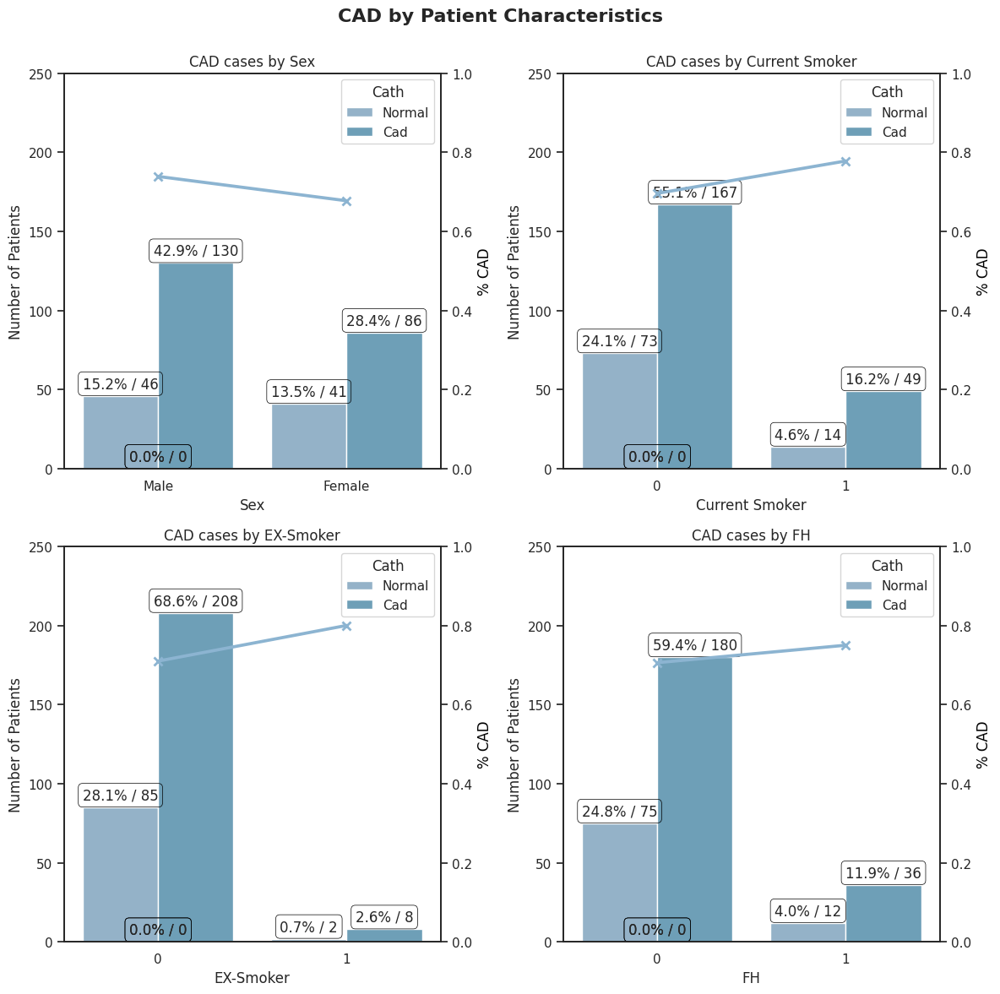

In [ ]:
n_rows, n_cols = 2, 2

fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 12))
fig.suptitle("CAD by Patient Characteristics\n", fontsize=16, fontweight='bold')

for i, col in enumerate(cat_cols_char):
    i, j = i//n_cols, i%n_cols
    ax = axes[i][j]

    rects = sns.countplot(x=col, hue="Cath", hue_order=['Normal', 'Cad'], data=df, ax=ax)

    for rect in rects.patches:
        height = rect.get_height()
        ax.text(rect.get_x()+rect.get_width()/2., height+5,
        "{:1.1f}% / {:d}".format(height/len(data)*100, int(height)),
        ha='center',
        bbox=dict(facecolor='none', edgecolor='black', boxstyle='round', linewidth=0.5))


    ax.set_xlabel(col)
    ax.set_ylabel("Number of Patients", fontsize="medium")
    ax.set_ylim([0,250])
    ax.set_title(f'CAD cases by {col}', fontsize=12)


    ax2 = ax.twinx()
    ax2 = sns.pointplot(x=col, y="Cath_binary", data=df, markers='x', ax=ax2, errorbar=None)
    ax2.set_ylim([0, 1])
    ax2.set_ylabel("% CAD", color='black')

fig.tight_layout()
fig.show()

## Underlying Disease vs CAD

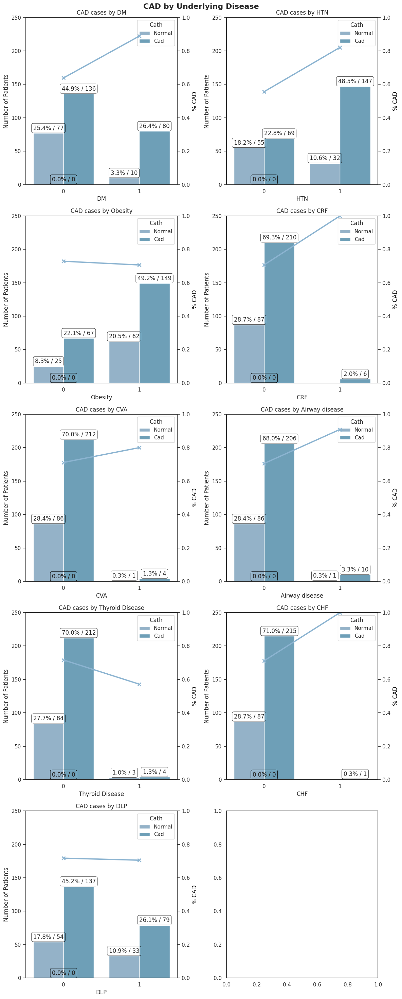

In [ ]:
n_rows, n_cols = 5, 2

fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 30))
fig.suptitle("CAD by Underlying Disease\n", fontsize=16, fontweight='bold')

for i, col in enumerate(cat_cols_dz):
    i, j = i//n_cols, i%n_cols
    ax = axes[i][j]

    rects = sns.countplot(x=col, hue="Cath", hue_order=['Normal', 'Cad'], data=df, ax=ax)

    for rect in rects.patches:
        height = rect.get_height()
        ax.text(
    rect.get_x() + rect.get_width()/2.,
    height + 5,
    "{:1.1f}% / {:d}".format(height/len(data)*100, int(height)),
    ha='center',
    bbox=dict(facecolor='none', edgecolor='black', boxstyle='round', linewidth=0.5)
)
    ax.set_xlabel(col)
    ax.set_ylabel("Number of Patients", fontsize="medium")
    ax.set_ylim([0,250])
    ax.set_title(f'CAD cases by {col}', fontsize=12)


    ax2 = ax.twinx()
    ax2 = sns.pointplot(x=col, y="Cath_binary", data=df, markers='x', ax=ax2, errorbar=None)
    ax2.set_ylim([0, 1])
    ax2.set_ylabel("% CAD", color='black')

fig.tight_layout()
fig.show()

## Physical Exam vs CAD

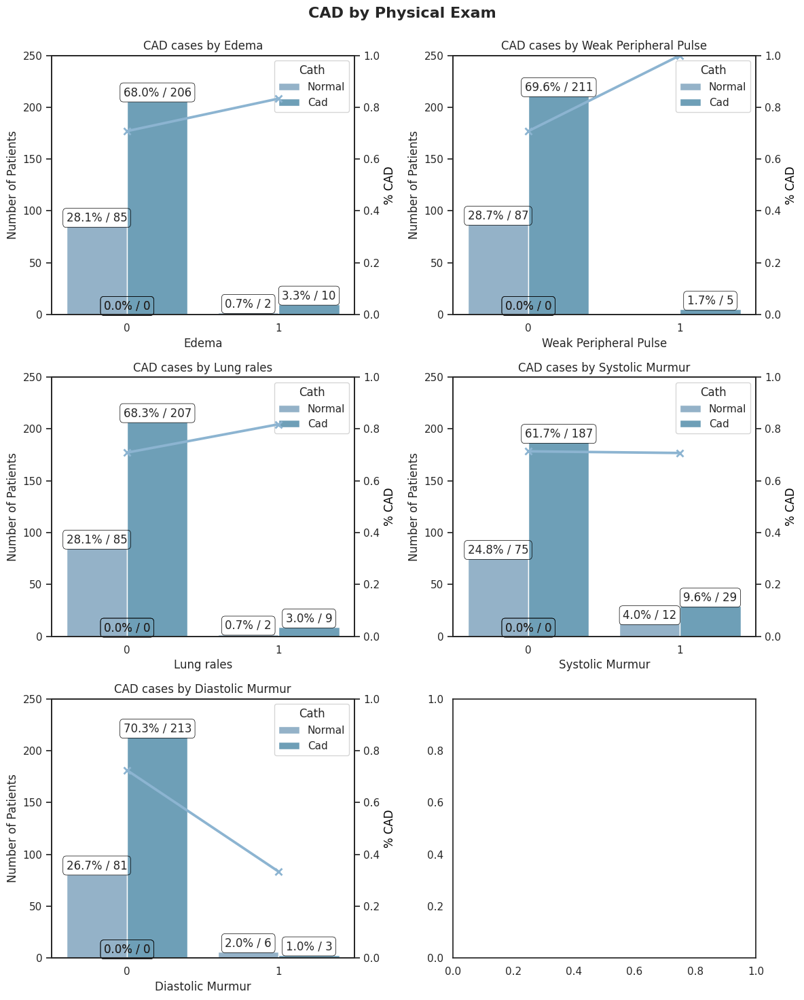

In [ ]:
n_rows, n_cols = 3, 2

fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 15))
fig.suptitle("CAD by Physical Exam\n", fontsize=16, fontweight='bold')

for i, col in enumerate(cat_cols_pe):
    i, j = i//n_cols, i%n_cols
    ax = axes[i][j]

    rects = sns.countplot(x=col, hue="Cath", hue_order=['Normal', 'Cad'], data=df, ax=ax)

    for rect in rects.patches:
        height = rect.get_height()
        ax.text(
    rect.get_x() + rect.get_width()/2.,
    height + 5,
    "{:1.1f}% / {:d}".format(height/len(data)*100, int(height)),
    ha='center',
    bbox=dict(facecolor='none', edgecolor='black', boxstyle='round', linewidth=0.5)
)


    ax.set_xlabel(col)
    ax.set_ylabel("Number of Patients", fontsize="medium")
    ax.set_ylim([0,250])
    ax.set_title(f'CAD cases by {col}', fontsize=12)


    ax2 = ax.twinx()
    ax2 = sns.pointplot(x=col, y="Cath_binary", data=df, markers='x', ax=ax2, errorbar=None)
    ax2.set_ylim([0, 1])
    ax2.set_ylabel("% CAD", color='black')

fig.tight_layout()
fig.show()

## Symptoms vs CAD

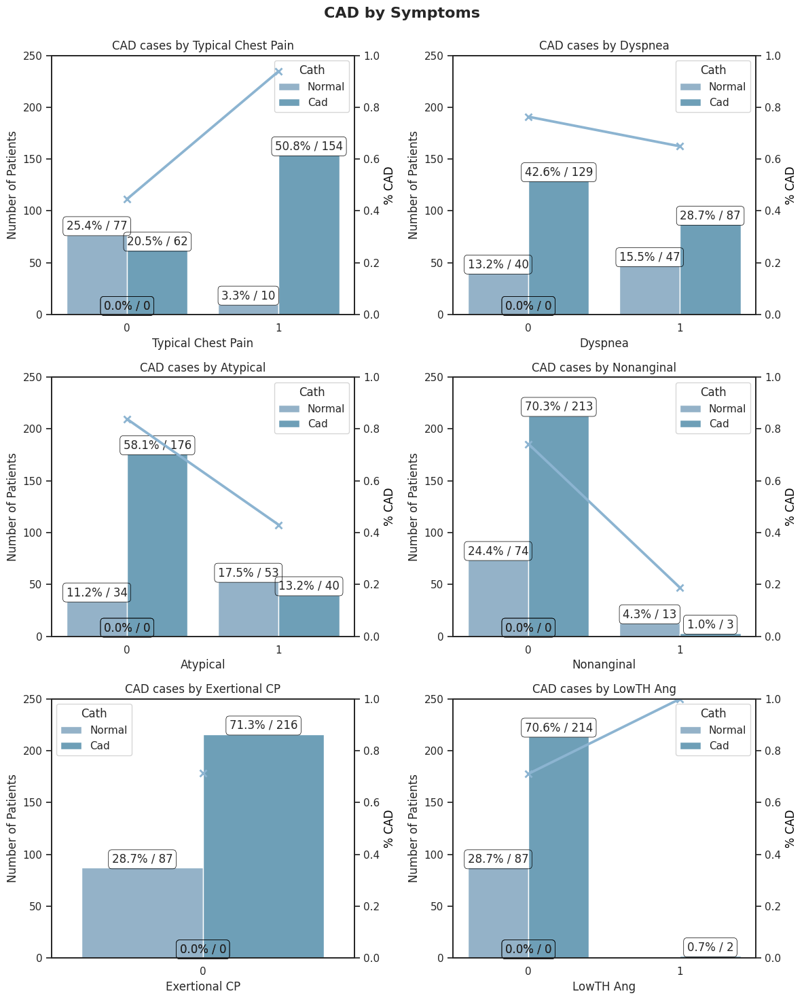

In [ ]:
n_rows, n_cols = 3, 2

fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 15))
fig.suptitle("CAD by Symptoms\n", fontsize=16, fontweight='bold')

for i, col in enumerate(cat_cols_sx):
    i, j = i//n_cols, i%n_cols
    ax = axes[i][j]

    rects = sns.countplot(x=col, hue="Cath", hue_order=['Normal', 'Cad'], data=df, ax=ax)

    for rect in rects.patches:
        height = rect.get_height()
        ax.text(
    rect.get_x() + rect.get_width()/2.,
    height + 5,
    "{:1.1f}% / {:d}".format(height/len(data)*100, int(height)),
    ha='center',
    bbox=dict(facecolor='none', edgecolor='black', boxstyle='round', linewidth=0.5)
)


    ax.set_xlabel(col)
    ax.set_ylabel("Number of Patients", fontsize="medium")
    ax.set_ylim([0,250])
    ax.set_title(f'CAD cases by {col}', fontsize=12)


    ax2 = ax.twinx()
    ax2 = sns.pointplot(x=col, y="Cath_binary", data=df, markers='x', ax=ax2, errorbar=None)
    ax2.set_ylim([0, 1])
    ax2.set_ylabel("% CAD", color='black')

fig.tight_layout()
fig.show()

## ECG Data vs CAD

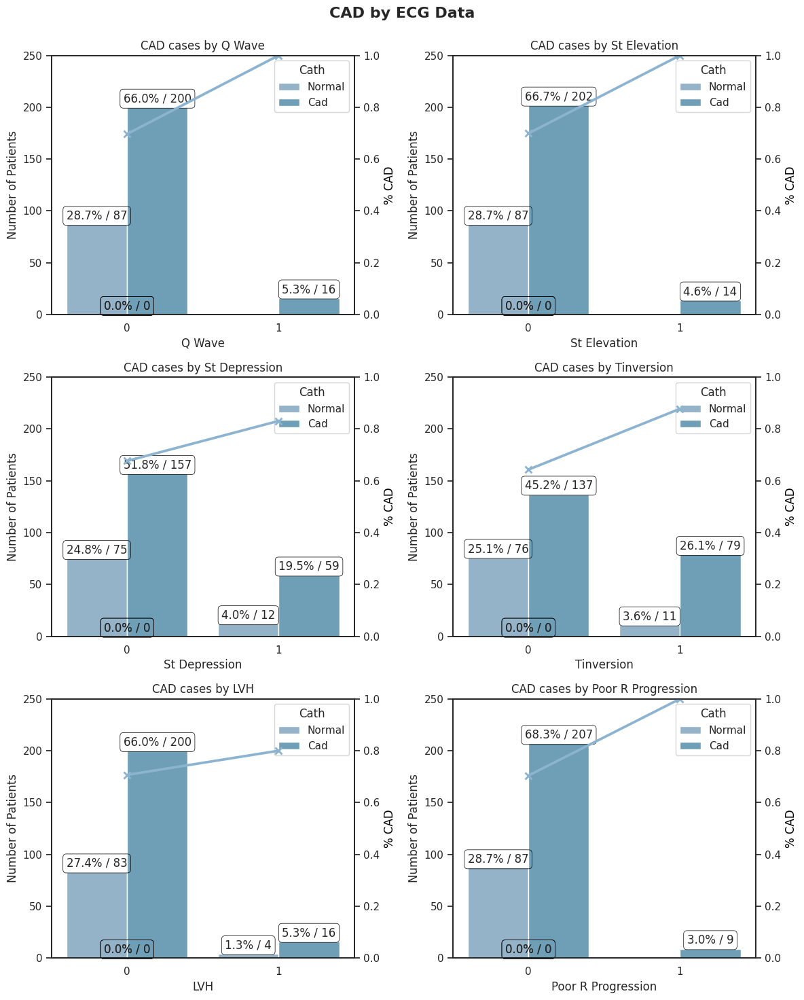

In [ ]:
n_rows, n_cols = 3, 2

fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 15))
fig.suptitle("CAD by ECG Data\n", fontsize=16, fontweight='bold')

for i, col in enumerate(cat_cols_ecg):
    i, j = i//n_cols, i%n_cols
    ax = axes[i][j]

    rects = sns.countplot(x=col, hue="Cath", hue_order=['Normal', 'Cad'], data=df, ax=ax)

    for rect in rects.patches:
        height = rect.get_height()
        ax.text(
    rect.get_x() + rect.get_width()/2.,
    height + 5,
    "{:1.1f}% / {:d}".format(height/len(data)*100, int(height)),
    ha='center',
    bbox=dict(facecolor='none', edgecolor='black', boxstyle='round', linewidth=0.5)
)


    ax.set_xlabel(col)
    ax.set_ylabel("Number of Patients", fontsize="medium")
    ax.set_ylim([0,250])
    ax.set_title(f'CAD cases by {col}', fontsize=12)


    ax2 = ax.twinx()
    ax2 = sns.pointplot(x=col, y="Cath_binary", data=df, markers='x', ax=ax2, errorbar=None)
    ax2.set_ylim([0, 1])
    ax2.set_ylabel("% CAD", color='black')

fig.tight_layout()
fig.show()

 Ordinal Variables

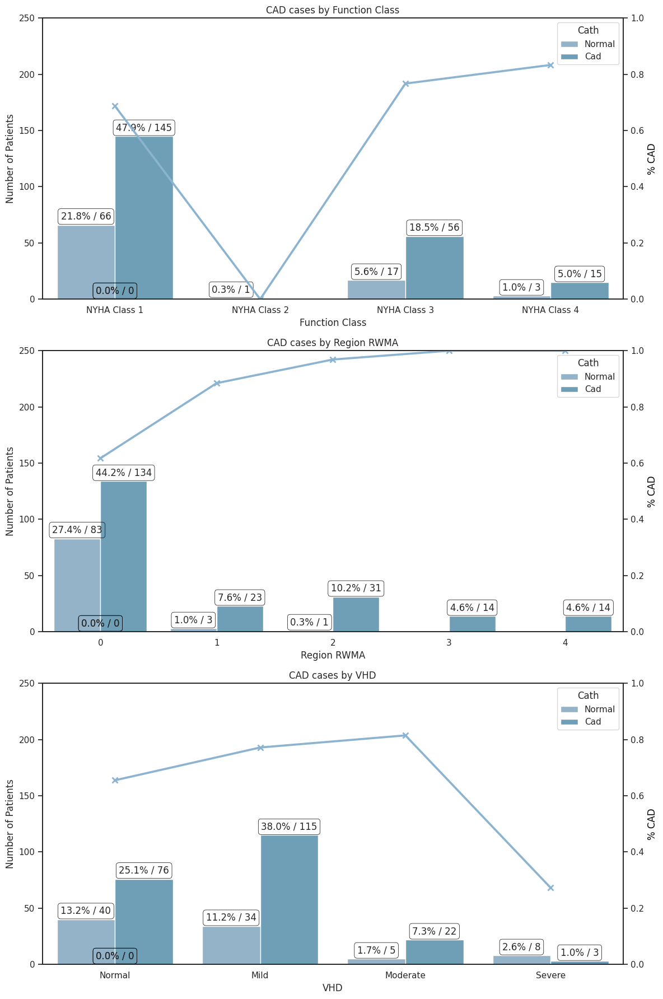

In [ ]:
ord_cols = ['Function Class', "Region RWMA", "VHD"]

n_rows, n_cols = 3, 1

fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 18))

for i, col in enumerate(ord_cols):
    i, j = i//n_cols, i%n_cols
    ax = axes[i]

    rects = sns.countplot(x=col, hue="Cath", hue_order=['Normal', 'Cad'], data=df, ax=ax)

    for rect in rects.patches:
        height = rect.get_height()
        ax.text(
    rect.get_x() + rect.get_width()/2.,
    height + 5,
    "{:1.1f}% / {:d}".format(height/len(data)*100, int(height)),
    ha='center',
    bbox=dict(facecolor='none', edgecolor='black', boxstyle='round', linewidth=0.5)
)


    ax.set_xlabel(col)
    ax.set_ylabel("Number of Patients", fontsize="medium")
    ax.set_ylim([0,250])
    ax.set_title(f'CAD cases by {col}', fontsize=12)


    ax2 = ax.twinx()
    ax2 = sns.pointplot(x=col, y="Cath_binary", data=df, markers='x', ax=ax2, errorbar=None)
    ax2.set_ylim([0, 1])
    ax2.set_ylabel("% CAD", color='black')

axes[0].set_xticklabels(['NYHA Class 1', 'NYHA Class 2', 'NYHA Class 3', 'NYHA Class 4'])
axes[2].set_xticklabels(['Normal', 'Mild', 'Moderate', 'Severe'])

fig.tight_layout()
fig.show()

 Numerical Variables

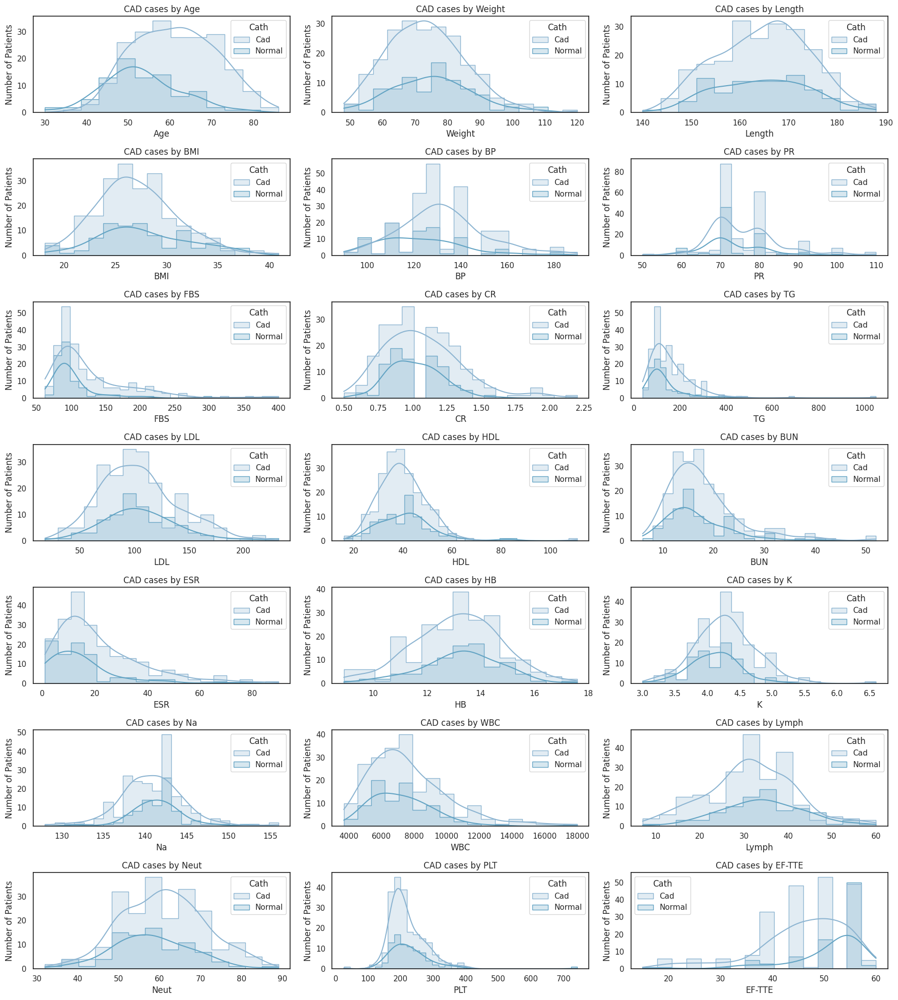

In [ ]:
num_cols = ['Age','Weight', 'Length','BMI', 'BP', 'PR', 'FBS', 'CR', 'TG', 'LDL', 'HDL', 'BUN', 'ESR', 'HB', 'K', 'Na', 'WBC', 'Lymph', 'Neut', 'PLT', 'EF-TTE']

n_rows, n_cols = 7, 3

fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 20))

for i, col in enumerate(num_cols):
    i, j = i//n_cols, i%n_cols
    ax = axes[i][j]

    #sns.set_style("darkgrid")
    ax = sns.histplot(data=data, x=col, hue="Cath", kde=True, ax=ax, element="step")

    ax.set_xlabel(col)
    ax.set_ylabel("Number of Patients", fontsize="medium")
    #ax.set_ylim([0,100])
    ax.set_title(f'CAD cases by {col}', fontsize=12)


fig.tight_layout()
fig.show()

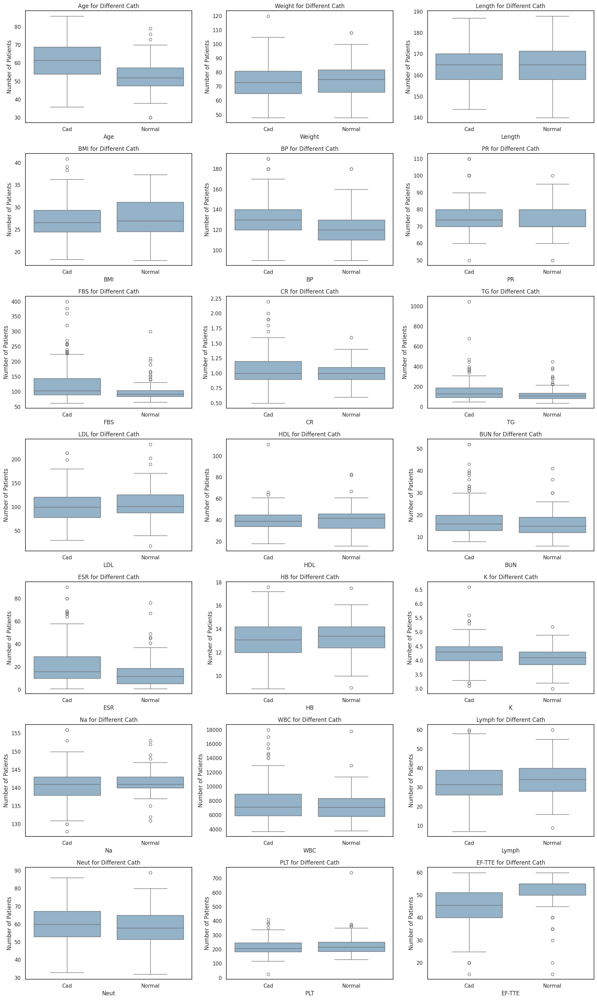

In [ ]:
num_cols = ['Age','Weight', 'Length','BMI', 'BP', 'PR', 'FBS', 'CR', 'TG', 'LDL', 'HDL', 'BUN', 'ESR', 'HB', 'K', 'Na', 'WBC', 'Lymph', 'Neut', 'PLT', 'EF-TTE']

n_rows, n_cols = 7, 3

fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 30))

for i, col in enumerate(num_cols):
    i, j = i//n_cols, i%n_cols
    ax = axes[i][j]

    #sns.set_style("darkgrid")
    ax.set_xlabel(col)
    ax.set_ylabel("Number of Patients", fontsize="medium")
    #ax.set_ylim([0,100])
    ax.set_title(f'{col} for Different Cath', fontsize=12)
    figure = sns.boxplot(x='Cath', y=col, data=data, ax=ax)



fig.tight_layout()
fig.show()

 Multivariate Analysis

## Chest Pain Type vs CAD

In [ ]:
data.groupby(['Typical Chest Pain', 'Atypical', 'Nonanginal', 'Exertional CP', 'LowTH Ang'])['Cath'].value_counts(normalize=False).to_frame(name="Number of Patients").style.background_gradient(cmap='Blues')

In [ ]:
data.groupby(['Typical Chest Pain', 'Atypical', 'Nonanginal', 'Exertional CP', 'LowTH Ang'])['Cath'].value_counts(normalize=True).mul(100).round(3).to_frame(name="Percent within group (%)").style.background_gradient(cmap='Blues')

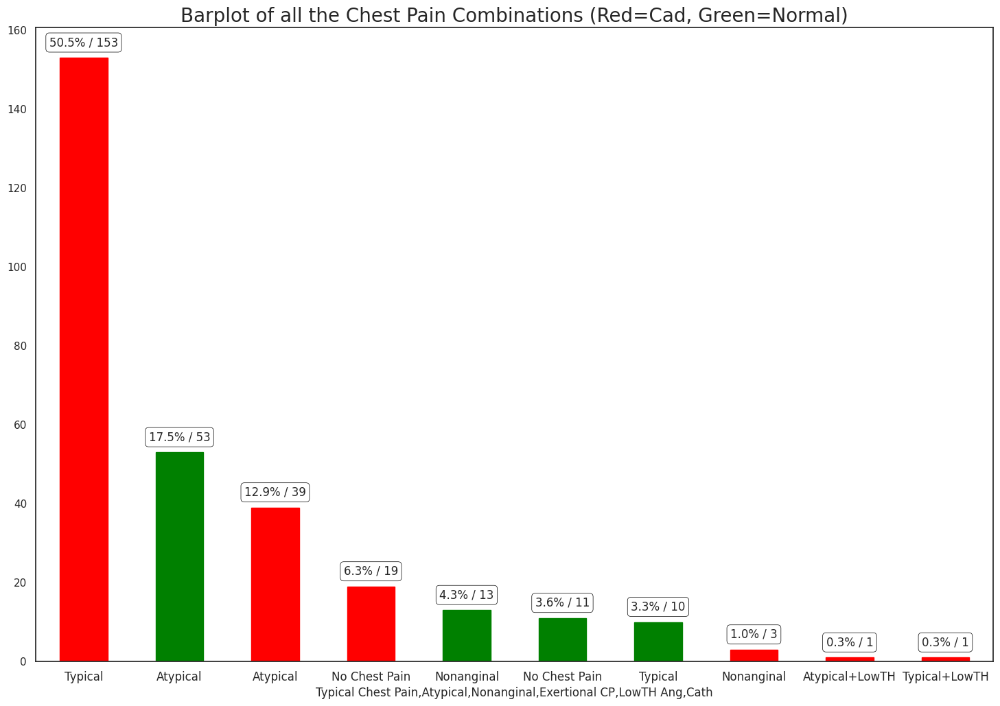

In [ ]:
cp_dt = data.groupby(['Typical Chest Pain', 'Atypical', 'Nonanginal', 'Exertional CP', 'LowTH Ang'])['Cath'].value_counts(normalize=False).sort_values(ascending=False).to_frame(name="Number of Patients")

ax = cp_dt.plot(kind='bar', figsize=(18, 12), legend=None)
color_flg = [1,0,1,1,0,0,0,1,1,1]

for i, color in enumerate(color_flg):
    if color==1:
        ax.patches[i].set_color('red')
    else:
        ax.patches[i].set_color('green')

for rect in ax.patches:
    height = rect.get_height()
    ax.text(rect.get_x()+rect.get_width()/2., height+3, "{:1.1f}% / {:d}".format(height/len(data)*100, height.astype(int)),ha='center', bbox=dict(facecolor='none', edgecolor='black', boxstyle='round', linewidth=0.5))


ax.set_xticklabels(['Typical','Atypical','Atypical','No Chest Pain','Nonanginal','No Chest Pain','Typical','Nonanginal','Atypical+LowTH','Typical+LowTH'], rotation=0, fontsize=12)
plt.title('Barplot of all the Chest Pain Combinations (Red=Cad, Green=Normal)', fontsize=20)
plt.show()

Correlation

In [ ]:
df.drop(labels='Cath_binary', axis=1, inplace=True)

In [ ]:
# Numerical variables:
num_cols = ['Age','Weight', 'Length','BMI', 'BP', 'PR', 'FBS', 'CR', 'TG', 'LDL', 'HDL', 'BUN', 'ESR', 'HB', 'K', 'Na', 'WBC','Lymph', 'Neut', 'PLT', 'EF-TTE']

# Categorical variables:
cat_cols = ['Sex', 'DM', 'HTN', 'Current Smoker', 'EX-Smoker', 'FH', 'Obesity', 'CRF', 'CVA', 'Airway disease', 'Thyroid Disease','CHF', 'DLP', 'Edema', 'Weak Peripheral Pulse', 'Lung rales', 'Systolic Murmur', 'Diastolic Murmur', 'Typical Chest Pain','Dyspnea', 'Atypical', 'Nonanginal', 'Exertional CP', 'LowTH Ang', 'Q Wave', 'St Elevation', 'St Depression', 'Tinversion','LVH', 'Poor R Progression','Cath']
cat_cols.remove('Cath')

# Ordinal variables
ord_cols = ['Function Class', "Region RWMA", "VHD"]

dummy_variables = pd.get_dummies(df, columns=cat_cols, drop_first=True)

In [ ]:
scaler = StandardScaler()
scaled_numerical = scaler.fit_transform(df[num_cols])
scaled_numerical_df = pd.DataFrame(scaled_numerical, columns=num_cols)

In [ ]:
dummy_variables = dummy_variables.drop(num_cols+ord_cols+['Cath'], axis=1)
cath = {"Cad": 1, "Normal":0}
df['Cath'] = df['Cath'].map(cath)
processed_df = pd.concat([dummy_variables, scaled_numerical_df, df[ord_cols], df['Cath']], axis=1)

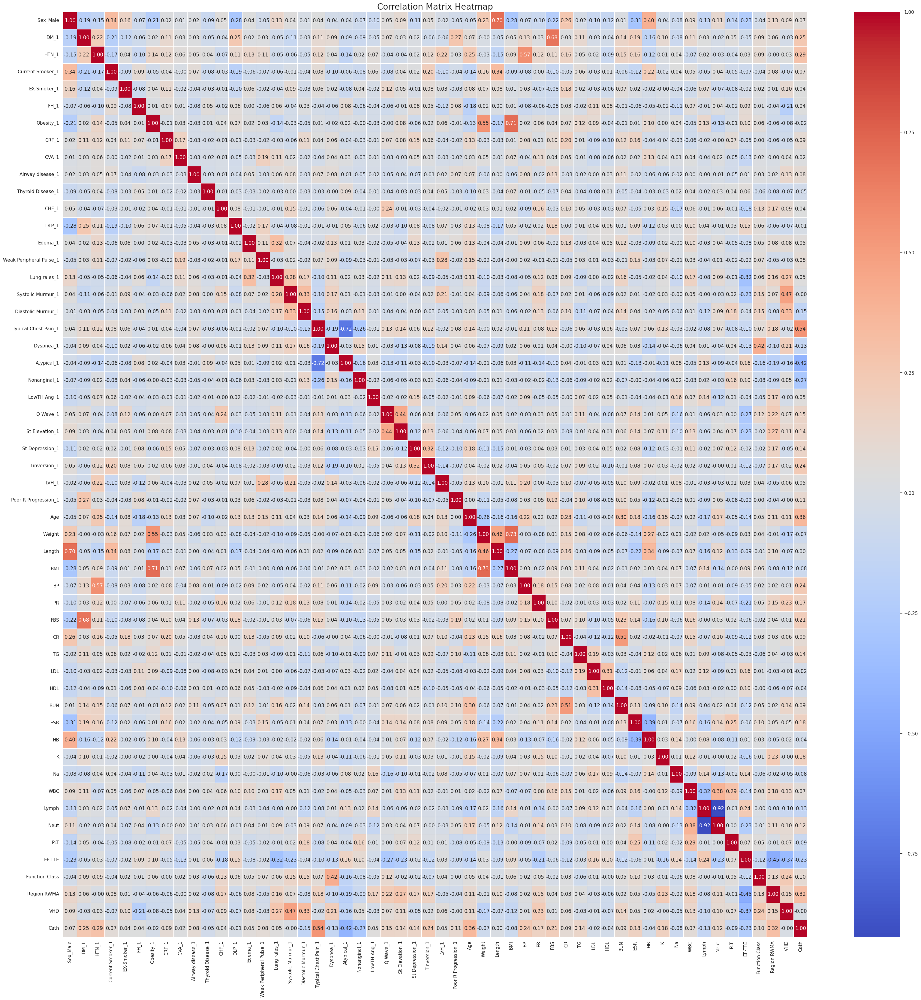

In [ ]:
correlation_matrix = processed_df.corr()
plt.figure(figsize=(40,40))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5, fmt='.2f')
plt.title("Correlation Matrix Heatmap", fontsize=20)
plt.show()

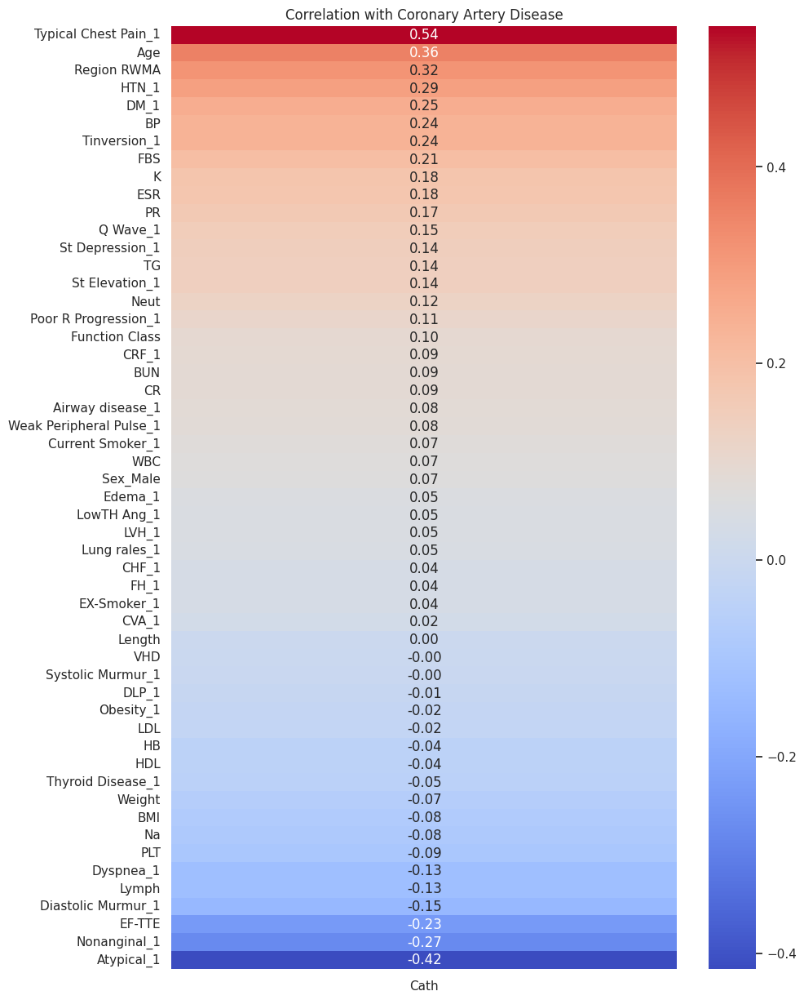

In [ ]:
corr = processed_df.corr()
target_corr = corr['Cath'].drop('Cath')

target_corr_sorted = target_corr.sort_values(ascending=False)

plt.figure(figsize=(10,15))
sns.set(font_scale=1.0)
sns.set_style("white")
sns.set_palette("PuBuGn_d")
sns.heatmap(target_corr_sorted.to_frame(), cmap="coolwarm", annot=True, fmt='.2f')
plt.title("Correlation with Coronary Artery Disease")
plt.show()

 Mutual Information

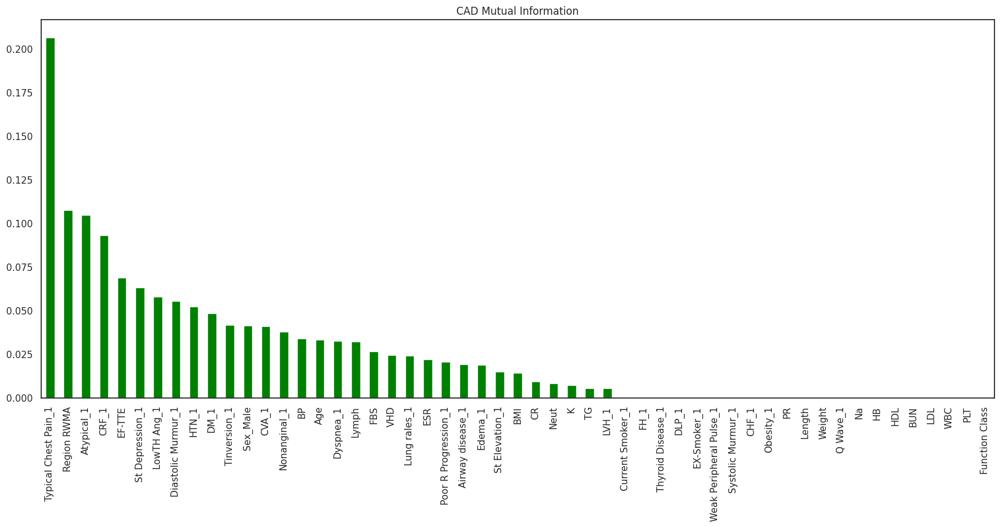

In [ ]:
from sklearn.feature_selection import mutual_info_classif, SelectKBest

mutual_info = mutual_info_classif(processed_df.drop(['Cath'], axis=1), processed_df['Cath'], random_state=seed)
mutual_info = pd.Series(mutual_info)
mutual_info.index = processed_df.drop(['Cath'], axis=1).columns
columns = mutual_info.sort_values(ascending=False)
columns.plot.bar(title='CAD Mutual Information', figsize=(20, 8), color="green")
plt.show()

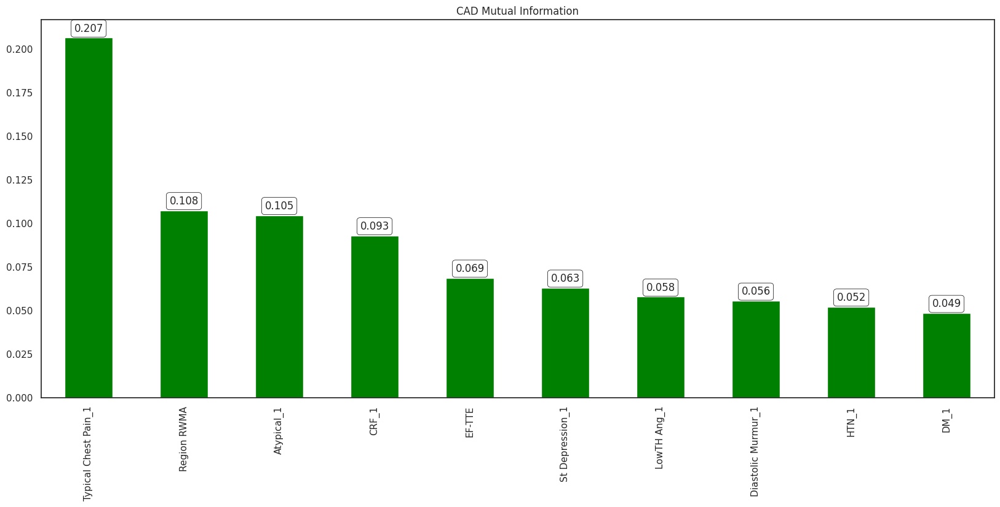

In [ ]:
columns = mutual_info.sort_values(ascending=False)[:10]
ax = columns.plot.bar(title='CAD Mutual Information', figsize=(20, 8), color="green")
for rect in ax.patches:
    height = rect.get_height()
    ax.text(rect.get_x()+rect.get_width()/2., height+0.0035, "{:1.3f}".format(height), ha='center', bbox=dict(facecolor='none', edgecolor='black', boxstyle='round', linewidth=0.5))

plt.show()

# **Predictive Analysis**

Preprocessing

In [ ]:
data.head()

,Age,Weight,Length,Sex,BMI,DM,HTN,Current Smoker,EX-Smoker,FH,...,K,Na,WBC,Lymph,Neut,PLT,EF-TTE,Region RWMA,VHD,Cath
0,53,90,175,Male,29.387755,0,1,1,0,0,...,4.7,141,5700,39,52,261,50,0,0,Cad
1,67,70,157,Female,28.398718,0,1,0,0,0,...,4.7,156,7700,38,55,165,40,4,0,Cad
2,54,54,164,Male,20.077335,0,0,1,0,0,...,4.7,139,7400,38,60,230,40,2,1,Cad
3,66,67,158,Female,26.838648,0,1,0,0,0,...,4.4,142,13000,18,72,742,55,0,3,Normal
4,50,87,153,Female,37.165193,0,1,0,0,0,...,4.0,140,9200,55,39,274,50,0,3,Normal


In [ ]:
X = data.drop("Cath", axis=1)
y = data['Cath']

In [ ]:
map_label = {"Cad":1, "Normal":0}
y = y.map(map_label)

In [ ]:
# Numerical variables:
num_cols = ['Age','Weight', 'Length','BMI', 'BP', 'PR', 'FBS', 'CR', 'TG', 'LDL', 'HDL', 'BUN', 'ESR', 'HB', 'K', 'Na', 'WBC', 'Lymph', 'Neut', 'PLT', 'EF-TTE']

# Categorical variables:
cat_cols = ['Sex', 'DM', 'HTN', 'Current Smoker', 'EX-Smoker', 'FH', 'Obesity', 'CRF', 'CVA', 'Airway disease', 'Thyroid Disease', 'CHF', 'DLP', 'Edema', 'Weak Peripheral Pulse', 'Lung rales', 'Systolic Murmur', 'Diastolic Murmur', 'Typical Chest Pain', 'Dyspnea', 'Atypical', 'Nonanginal', 'Exertional CP', 'LowTH Ang', 'Q Wave', 'St Elevation', 'St Depression', 'Tinversion', 'LVH', 'Poor R Progression', 'Cath']
cat_cols.remove('Cath')

# Ordinal variables
ord_cols = ['Function Class', "Region RWMA", "VHD"]

In [ ]:
preprocessor = ColumnTransformer(transformers = [('OHE', OneHotEncoder(handle_unknown='ignore', sparse_output=False, drop='first', dtype=np.int64), cat_cols),
                                                 ('Scaler', StandardScaler(), num_cols)],
                                 remainder = 'passthrough',
                                 verbose_feature_names_out = False).set_output(transform = 'pandas')
X_prep = preprocessor.fit_transform(X)

In [ ]:
X_prep.head()

,Sex_Male,DM_1,HTN_1,Current Smoker_1,EX-Smoker_1,FH_1,Obesity_1,CRF_1,CVA_1,Airway disease_1,...,K,Na,WBC,Lymph,Neut,PLT,EF-TTE,Function Class,Region RWMA,VHD
0,1,0,1,1,0,0,1,0,0,0,...,1.025931,0.000868,-0.772712,0.662975,-0.801571,0.650977,0.310686,0,0,0
1,0,0,1,0,0,0,1,0,0,0,...,1.025931,3.946579,0.057248,0.562534,-0.506461,-0.930681,-0.811339,0,4,0
2,1,0,0,1,0,0,0,0,0,0,...,1.025931,-0.525227,-0.067246,0.562534,-0.014609,0.140233,-0.811339,0,2,1
3,0,0,1,0,0,0,1,0,0,0,...,0.370114,0.263916,2.256644,-1.446280,1.165833,8.575744,0.871699,3,0,3
4,0,0,1,0,0,0,1,0,0,0,...,-0.504308,-0.262179,0.679719,2.270027,-2.080384,0.865160,0.310686,2,0,3


In [ ]:
X_prep.columns

Index(['Sex_Male', 'DM_1', 'HTN_1', 'Current Smoker_1', 'EX-Smoker_1', 'FH_1',
       'Obesity_1', 'CRF_1', 'CVA_1', 'Airway disease_1', 'Thyroid Disease_1',
       'CHF_1', 'DLP_1', 'Edema_1', 'Weak Peripheral Pulse_1', 'Lung rales_1',
       'Systolic Murmur_1', 'Diastolic Murmur_1', 'Typical Chest Pain_1',
       'Dyspnea_1', 'Atypical_1', 'Nonanginal_1', 'LowTH Ang_1', 'Q Wave_1',
       'St Elevation_1', 'St Depression_1', 'Tinversion_1', 'LVH_1',
       'Poor R Progression_1', 'Age', 'Weight', 'Length', 'BMI', 'BP', 'PR',
       'FBS', 'CR', 'TG', 'LDL', 'HDL', 'BUN', 'ESR', 'HB', 'K', 'Na', 'WBC',
       'Lymph', 'Neut', 'PLT', 'EF-TTE', 'Function Class', 'Region RWMA',
       'VHD'],
      dtype='object')

Train Test Split

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_prep, y, test_size=0.2, stratify=y, random_state=seed)
X_train_en, y_train_en = X_train, y_train

print("Training Data Shape : ", X_train.shape, y_train.shape)
print("Test Data Shape : ", X_test.shape, y_test.shape)

Training Data Shape :  (242, 53) (242,)
Test Data Shape :  (61, 53) (61,)


 Oversampling by SMOTENC

In [ ]:
X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size=0.2, stratify=y_train, random_state=seed)
print("Training Data Shape : ", X_train.shape, y_train.shape)
print("Validation Data Shape : ", X_valid.shape, y_valid.shape)

Training Data Shape :  (193, 53) (193,)
Validation Data Shape :  (49, 53) (49,)


In [ ]:

from imblearn.over_sampling import SMOTENC

catord_cols = ['Sex_Male', 'DM_1', 'HTN_1', 'Current Smoker_1', 'EX-Smoker_1', 'FH_1', 'Obesity_1', 'CRF_1', 'CVA_1', 'Airway disease_1', 'Thyroid Disease_1', 'CHF_1', 'DLP_1', 'Edema_1', 'Weak Peripheral Pulse_1', 'Lung rales_1', 'Systolic Murmur_1', 'Diastolic Murmur_1', 'Typical Chest Pain_1', 'Dyspnea_1', 'Atypical_1', 'Nonanginal_1', 'LowTH Ang_1', 'Q Wave_1', 'St Elevation_1', 'St Depression_1', 'Tinversion_1', 'LVH_1', 'Poor R Progression_1', 'Function Class', "Region RWMA", "VHD"]
oversample = SMOTENC(random_state=seed, categorical_features=catord_cols)
print("Original Train Data : ", X_train.shape, y_train.shape)

X_smote, y_smote = oversample.fit_resample(X_train, y_train)
print("Smote Train Data : ", X_smote.shape, y_smote.shape)


Original Train Data :  (193, 53) (193,)
Smote Train Data :  (276, 53) (276,)


In [ ]:
X_smote.columns

Index(['Sex_Male', 'DM_1', 'HTN_1', 'Current Smoker_1', 'EX-Smoker_1', 'FH_1',
       'Obesity_1', 'CRF_1', 'CVA_1', 'Airway disease_1', 'Thyroid Disease_1',
       'CHF_1', 'DLP_1', 'Edema_1', 'Weak Peripheral Pulse_1', 'Lung rales_1',
       'Systolic Murmur_1', 'Diastolic Murmur_1', 'Typical Chest Pain_1',
       'Dyspnea_1', 'Atypical_1', 'Nonanginal_1', 'LowTH Ang_1', 'Q Wave_1',
       'St Elevation_1', 'St Depression_1', 'Tinversion_1', 'LVH_1',
       'Poor R Progression_1', 'Age', 'Weight', 'Length', 'BMI', 'BP', 'PR',
       'FBS', 'CR', 'TG', 'LDL', 'HDL', 'BUN', 'ESR', 'HB', 'K', 'Na', 'WBC',
       'Lymph', 'Neut', 'PLT', 'EF-TTE', 'Function Class', 'Region RWMA',
       'VHD'],
      dtype='object')

In [ ]:
# Numerical variables:
num_cols = ['Age','Weight', 'Length','BMI', 'BP', 'PR', 'FBS', 'CR', 'TG', 'LDL', 'HDL', 'BUN', 'ESR', 'HB', 'K', 'Na', 'WBC', 'Lymph', 'Neut', 'PLT', 'EF-TTE']

# Categorical variables:
cat_cols_ = ['Sex_Male', 'DM_1', 'HTN_1', 'Current Smoker_1', 'EX-Smoker_1', 'FH_1', 'Obesity_1', 'CRF_1', 'CVA_1', 'Airway disease_1', 'Thyroid Disease_1', 'CHF_1', 'DLP_1', 'Edema_1', 'Weak Peripheral Pulse_1', 'Lung rales_1', 'Systolic Murmur_1', 'Diastolic Murmur_1', 'Typical Chest Pain_1', 'Dyspnea_1', 'Atypical_1', 'Nonanginal_1', 'LowTH Ang_1', 'Q Wave_1', 'St Elevation_1', 'St Depression_1', 'Tinversion_1', 'LVH_1', 'Poor R Progression_1']

# Ordinal variables
ord_cols = ['Function Class', "Region RWMA", "VHD"]

print(f"[Unique Values in {len(cat_cols)} Categorical Variables]\n")

for cat_col in cat_cols_:
    print("* {} : {} Unique Values =>".format(cat_col, X_smote[cat_col].nunique()), X_smote[cat_col].unique())

[Unique Values in 30 Categorical Variables]

* Sex_Male : 2 Unique Values => [1 0]
* DM_1 : 2 Unique Values => [0 1]
* HTN_1 : 2 Unique Values => [1 0]
* Current Smoker_1 : 2 Unique Values => [0 1]
* EX-Smoker_1 : 2 Unique Values => [0 1]
* FH_1 : 2 Unique Values => [0 1]
* Obesity_1 : 2 Unique Values => [1 0]
* CRF_1 : 2 Unique Values => [0 1]
* CVA_1 : 2 Unique Values => [0 1]
* Airway disease_1 : 2 Unique Values => [0 1]
* Thyroid Disease_1 : 2 Unique Values => [0 1]
* CHF_1 : 1 Unique Values => [0]
* DLP_1 : 2 Unique Values => [1 0]
* Edema_1 : 2 Unique Values => [0 1]
* Weak Peripheral Pulse_1 : 2 Unique Values => [0 1]
* Lung rales_1 : 2 Unique Values => [0 1]
* Systolic Murmur_1 : 2 Unique Values => [0 1]
* Diastolic Murmur_1 : 2 Unique Values => [0 1]
* Typical Chest Pain_1 : 2 Unique Values => [0 1]
* Dyspnea_1 : 2 Unique Values => [0 1]
* Atypical_1 : 2 Unique Values => [1 0]
* Nonanginal_1 : 2 Unique Values => [0 1]
* LowTH Ang_1 : 2 Unique Values => [0 1]
* Q Wave_1 : 2 Uni

In [ ]:
for ord_col in ord_cols:
    print("* {} : {} Unique Values =>".format(ord_col, X_smote[ord_col].nunique()), X_smote[ord_col].unique())

* Function Class : 4 Unique Values => [0 2 3 1]
* Region RWMA : 5 Unique Values => [0 2 3 1 4]
* VHD : 4 Unique Values => [0 1 3 2]


# ***Optuna Switch***

Since hyperparameter tuning process takes a comparatively long time, I made variable `optuna_switch`, which is initally set to `False`. If you want to tune the hyperparameter of the models, just change `optuna_switch = False` into `optuna_switch = True`. Then optuna will tune the hyperparameter of the three models, which are `CatBoost`, `XGBoost`, and `LightGBM`.

In [ ]:
optuna_switch = False

 CatBoost

## Hyperparameter tuning by Optuna

In [ ]:
!pip install optuna

In [ ]:
import optuna
import plotly.graph_objects as go
import plotly.figure_factory as ff

In [ ]:
def objective(trial):

    params = {
        'iterations':trial.suggest_int("iterations", 100, 1000),
        'objective': trial.suggest_categorical('objective', ['Logloss', 'CrossEntropy']),
        'bootstrap_type': trial.suggest_categorical('bootstrap_type', ['Bayesian', 'Bernoulli', 'MVS']),
        'od_wait':trial.suggest_int('od_wait', 500, 2000),
        'learning_rate' : trial.suggest_uniform('learning_rate', 0.001, 0.1),
        'reg_lambda': trial.suggest_uniform('reg_lambda',1e-5,100),
        'random_strength': trial.suggest_uniform('random_strength',10,50),
        'depth': trial.suggest_int('depth', 3, 10),
        'min_data_in_leaf': trial.suggest_int('min_data_in_leaf',1,30),
        'leaf_estimation_iterations': trial.suggest_int('leaf_estimation_iterations',1,15),
        'verbose': False,
    }

    if params['bootstrap_type'] == 'Bayesian':
        params['bagging_temperature'] = trial.suggest_float('bagging_temperature', 0, 10)
    elif params['bootstrap_type'] == 'Bernoulli':
        params['subsample'] = trial.suggest_float('subsample', 0.1, 1)


    catord_cols = ['Sex_Male', 'DM_1', 'HTN_1', 'Current Smoker_1', 'EX-Smoker_1', 'FH_1', 'Obesity_1', 'CRF_1', 'CVA_1', 'Airway disease_1', 'Thyroid Disease_1', 'CHF_1', 'DLP_1', 'Edema_1', 'Weak Peripheral Pulse_1', 'Lung rales_1', 'Systolic Murmur_1', 'Diastolic Murmur_1', 'Typical Chest Pain_1', 'Dyspnea_1', 'Atypical_1', 'Nonanginal_1', 'LowTH Ang_1', 'Q Wave_1', 'St Elevation_1', 'St Depression_1', 'Tinversion_1', 'LVH_1', 'Poor R Progression_1', 'Function Class', "Region RWMA", "VHD"]
    model = CatBoostClassifier(**params)
    cat_model = model.fit(X_train, y_train, cat_features=catord_cols, eval_set=[(X_valid, y_valid)], use_best_model=True)

    pred = cat_model.predict(X_valid)
    #pred_proba = xgb_model.predict_proba(X_valid)[:, 1]
    score = f1_score(y_valid, pred)
    #score = accuracy_score(y_valid, pred)
    #score = precision_score(y_valid, pred)
    #score = recall_score(y_valid, pred)
    #score = roc_auc_score(y_valid, pred_proba)

    return score

In [ ]:
if optuna_switch == True:
    study_cb = optuna.create_study(direction='maximize')
    study_cb.optimize(objective, n_trials = 50, show_progress_bar=True)

In [ ]:
if optuna_switch == True:
    print("Best Hyperparameters: ", study_cb.best_params)
    print("Best F1 Score: ", study_cb.best_value)

## Training Model

In [ ]:
def roc_curve_plot(y_test, pred_proba_c1):
    fprs, tprs, thresholds = roc_curve(y_test, pred_proba_c1)
    plt.plot(fprs, tprs, label="ROC", color='green', linestyle='dashed', linewidth=4)
    plt.plot([0,1], [0,1], "k-", label="Random", linestyle='dashed', color='gray', linewidth=3)


    start, end = plt.xlim()
    plt.xticks(np.round(np.arange(start, end, 0.1), 2))
    plt.xlim(0, 1)
    plt.ylim(0, 1)
    plt.xlabel("FPR( 1 - Specificity )")
    plt.ylabel("TPR( Recall )")
    plt.legend()

In [ ]:
def get_clf_eval(y_test, pred, pred_proba):

    confusion = confusion_matrix(y_test, pred)
    accuracy = accuracy_score(y_test, pred)
    precision = precision_score(y_test, pred)
    recall = recall_score(y_test, pred)
    f1 = f1_score(y_test, pred)
    roc_auc = roc_auc_score(y_test, pred_proba)

    disp = ConfusionMatrixDisplay(confusion_matrix=confusion)
    disp.plot()
    plt.show()

    roc_curve_plot(y_test, pred_proba)

    eval_metrics = {'accuracy': accuracy, 'precision': precision, 'recall': recall, 'f1': f1, 'roc_auc': roc_auc}

    return eval_metrics

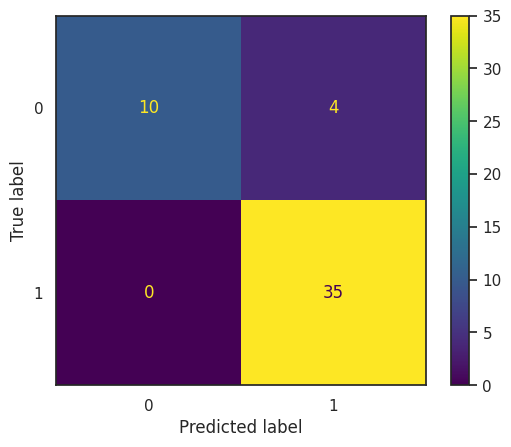

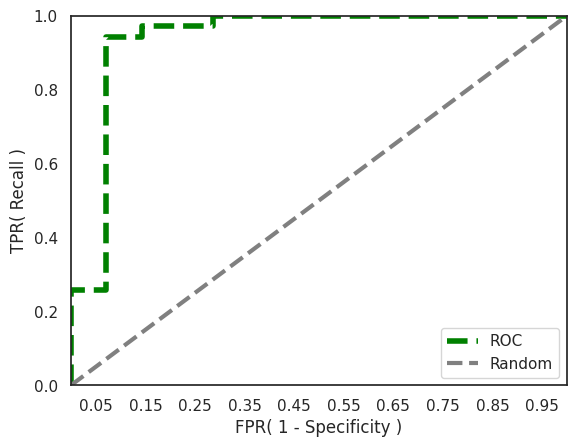

In [ ]:
catord_cols = ['Sex_Male', 'DM_1', 'HTN_1', 'Current Smoker_1', 'EX-Smoker_1', 'FH_1', 'Obesity_1', 'CRF_1', 'CVA_1', 'Airway disease_1', 'Thyroid Disease_1', 'CHF_1', 'DLP_1', 'Edema_1', 'Weak Peripheral Pulse_1', 'Lung rales_1', 'Systolic Murmur_1', 'Diastolic Murmur_1', 'Typical Chest Pain_1', 'Dyspnea_1', 'Atypical_1', 'Nonanginal_1', 'LowTH Ang_1', 'Q Wave_1', 'St Elevation_1', 'St Depression_1', 'Tinversion_1', 'LVH_1', 'Poor R Progression_1', 'Function Class', "Region RWMA", "VHD"]

if optuna_switch == True:
    cb = CatBoostClassifier(random_state=seed, verbose=0, **study_cb.best_params)
else:
    cb = CatBoostClassifier(random_state=seed, verbose=0, iterations = 848, objective = 'CrossEntropy', bootstrap_type = 'Bernoulli', od_wait = 1785, learning_rate = 0.09967519851171666, reg_lambda = 14.530290657887146, random_strength = 48.95669246924815, depth = 4, min_data_in_leaf = 26, leaf_estimation_iterations = 6, subsample = 0.15606746339296185)

cat_model = cb.fit(X_train, y_train, cat_features=catord_cols)

pred = cat_model.predict(X_valid)
pred_proba = cat_model.predict_proba(X_valid)[:, 1]
metrics_train_cb = get_clf_eval(y_valid.values, pred, pred_proba)

In [ ]:
#metrics_train_cb

fig = go.Figure()
fig.add_trace(
    go.Table(
        columnwidth=[80,100],
        header=dict(values=['Metrics', 'CatBoost_Train'], height=50, font_size=22),
        cells=dict(
            values=[
                ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'ROC_AUC'],
                [
                    round(metrics_train_cb['accuracy'], 3),
                    round(metrics_train_cb['precision'], 3),
                    round(metrics_train_cb['recall'], 3),
                    round(metrics_train_cb['f1'], 3),
                    round(metrics_train_cb['roc_auc'], 3)
                ]
            ],
            height=50,
            font_size=16
        )
    )
)

fig.show()

## Evaluate the Model

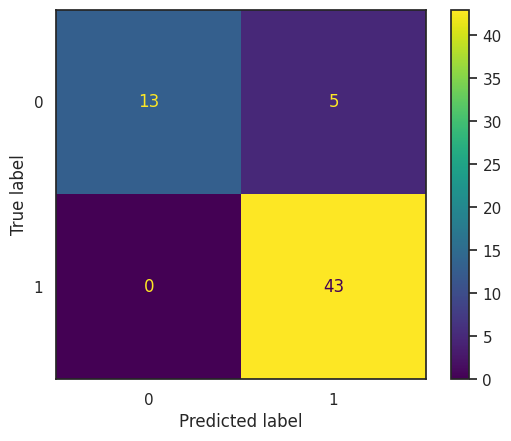

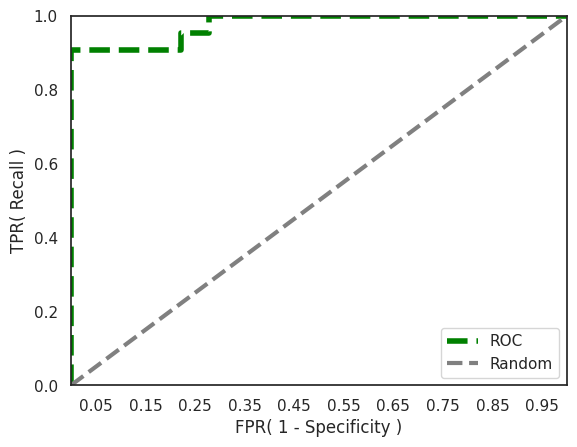

In [ ]:
pred = cat_model.predict(X_test)
pred_proba = cat_model.predict_proba(X_test)[:, 1]
metrics_test_cb = get_clf_eval(y_test.values, pred, pred_proba)

In [ ]:
# metrics_test_cb

fig = go.Figure()

fig.add_trace(
    go.Table(
        columnwidth=[80, 100],
        header=dict(
            values=['Metrics', 'CatBoost_Test'],
            height=50,
            font_size=22
        ),
        cells=dict(
            values=[
                ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'ROC_AUC'],
                [
                    round(metrics_test_cb['accuracy'], 3),
                    round(metrics_test_cb['precision'], 3),
                    round(metrics_test_cb['recall'], 3),
                    round(metrics_test_cb['f1'], 3),
                    round(metrics_test_cb['roc_auc'], 3)
                ]
            ],
            height=50,
            font_size=16
        )
    )
)

fig.show()

 XGBoost

In [ ]:
def objective(trial):
    params = {
        "objective": "binary:logistic",
        'verbosity': 0,
        "eval_metric": "logloss",
        "tree_method": "gpu_hist",
        "booster": "gbtree",
        "random_state" : seed,
        "max_depth": trial.suggest_int("max_depth", 1, 9),
        "subsample": trial.suggest_float("subsample", 0.1, 1),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.1, 1),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.3),
        "min_child_weight": trial.suggest_int("min_child_weight", 1, 10),
        "gamma": trial.suggest_float("gamma", 0.01, 1),
        "reg_alpha": trial.suggest_float("reg_alpha", 0.01, 10),
        "reg_lambda": trial.suggest_float("reg_lambda", 0.01, 10),
        "n_estimators": trial.suggest_int("n_estimators", 50, 3000, step=50),
        "scale_pos_weight": trial.suggest_float("scale_pos_weight", 1, 10),
        "grow_policy": trial.suggest_categorical('grow_policy', ['depthwise', 'lossguide'])
    }

    model = XGBClassifier(**params)
    xgb_model = model.fit(X_train, y_train)

    pred = xgb_model.predict(X_valid)
    pred_proba = xgb_model.predict_proba(X_valid)[:, 1]
    score = f1_score(y_valid, pred)
    #score = accuracy_score(y_valid, pred)
    #score = precision_score(y_valid, pred)
    #score = recall_score(y_valid, pred)
    #score = roc_auc_score(y_valid, pred_proba)

    return score

## Training Model

In [ ]:
if optuna_switch == True:
    study_xgb = optuna.create_study(direction='maximize')
    study_xgb.optimize(objective, n_trials = 50, show_progress_bar=True)

In [ ]:
if optuna_switch == True:
    print("Best Hyperparameters: ", study_xgb.best_params)
    print("Best F1 Score: ", study_xgb.best_value)

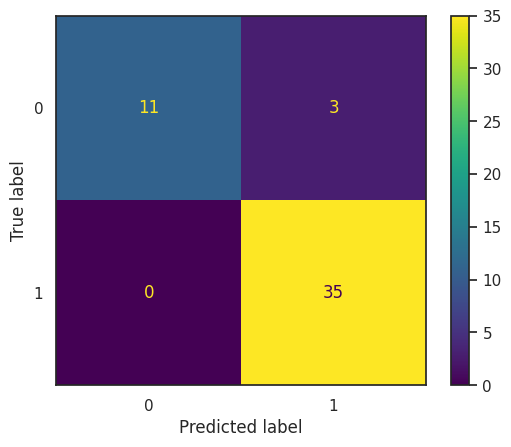

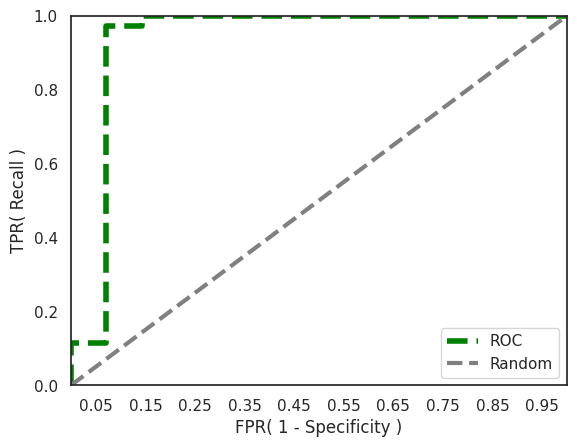

In [ ]:
if optuna_switch == True:
    xgb = XGBClassifier(random_state=seed, **study_xgb.best_params)
else:
    xgb = XGBClassifier(random_state=seed, max_depth = 4, subsample = 0.8455445119537031, colsample_bytree = 0.7473353578505076, learning_rate = 0.2343253699229094, min_child_weight = 1, gamma = 0.3290797801781987, reg_alpha = 1.0280651442885607, reg_lambda = 2.990770634501404, n_estimators = 2450, scale_pos_weight = 1.1196755081865422, grow_policy = 'lossguide')

xgb_model = xgb.fit(X_train, y_train)

pred = xgb_model.predict(X_valid)
pred_proba = xgb_model.predict_proba(X_valid)[:, 1]
metrics_train_xgb = get_clf_eval(y_valid.values, pred, pred_proba)

In [ ]:
# metrics_train_xgb

fig = go.Figure()

fig.add_trace(
    go.Table(
        columnwidth=[80, 100],
        header=dict(
            values=['Metrics', 'XGBoost_Train'],
            height=50,
            font_size=22
        ),
        cells=dict(
            values=[
                ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'ROC_AUC'],
                [
                    round(metrics_train_xgb['accuracy'], 3),
                    round(metrics_train_xgb['precision'], 3),
                    round(metrics_train_xgb['recall'], 3),
                    round(metrics_train_xgb['f1'], 3),
                    round(metrics_train_xgb['roc_auc'], 3)
                ]
            ],
            height=50,
            font_size=16
        )
    )
)

fig.show()

## Evaluate the Model

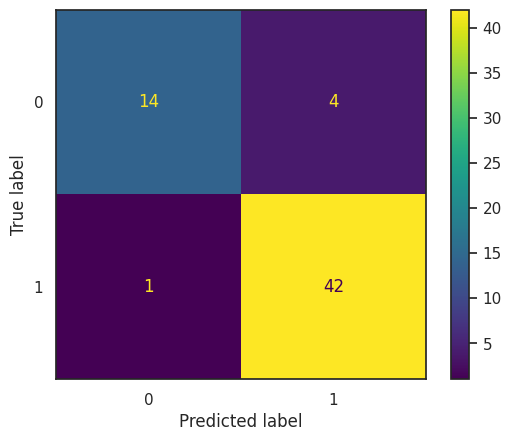

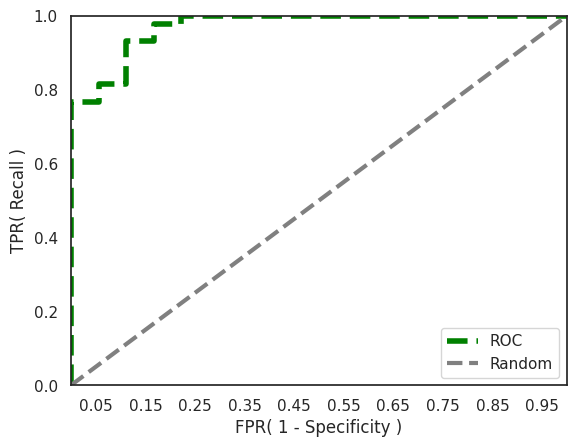

In [ ]:
pred = xgb_model.predict(X_test)
pred_proba = xgb_model.predict_proba(X_test)[:, 1]
metrics_test_xgb = get_clf_eval(y_test.values, pred, pred_proba)

In [ ]:
# metrics_test_xgb

fig = go.Figure()

fig.add_trace(
    go.Table(
        columnwidth=[80, 100],
        header=dict(
            values=['Metrics', 'XGBoost_Test'],
            height=50,
            font_size=22
        ),
        cells=dict(
            values=[
                ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'ROC_AUC'],
                [
                    round(metrics_test_xgb['accuracy'], 3),
                    round(metrics_test_xgb['precision'], 3),
                    round(metrics_test_xgb['recall'], 3),
                    round(metrics_test_xgb['f1'], 3),
                    round(metrics_test_xgb['roc_auc'], 3)
                ]
            ],
            height=50,
            font_size=16
        )
    )
)

fig.show()

 LightGBM

In [ ]:
def objective(trial):
    params = {
        "verbose": -1,
        "random_state": seed,
        "max_depth": trial.suggest_int("max_depth", 1, 9),
        "subsample": trial.suggest_float("subsample", 0.1, 1),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.1, 1),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.3),
        "min_child_weight": trial.suggest_int("min_child_weight", 1, 10),
        "reg_alpha": trial.suggest_float("reg_alpha", 0.01, 10),
        "reg_lambda": trial.suggest_float("reg_lambda", 0.01, 10),
        "n_estimators": trial.suggest_int("n_estimators", 50, 3000, step=50),
        "scale_pos_weight": trial.suggest_float("scale_pos_weight", 1, 10),
        "device": "gpu",
        "gpu_platform_id": 0,
        "gpu_device_id": 0,
        "force_col_wise": True
    }

    model = LGBMClassifier(**params)
    lgb_model = model.fit(X_train, y_train)

    pred = lgb_model.predict(X_valid)
    pred_proba = xgb_model.predict_proba(X_valid)[:, 1]

    score = f1_score(y_valid, pred)
    #score = accuracy_score(y_valid, pred)
    #score = precision_score(y_valid, pred)
    #score = recall_score(y_valid, pred)
    #score = roc_auc_score(y_valid, pred_proba)

    return score

## Training Model

In [ ]:
if optuna_switch == True:
    study_lgb = optuna.create_study(direction='maximize')
    study_lgb.optimize(objective, n_trials = 50, show_progress_bar=True)

In [ ]:
if optuna_switch == True:
    print("Best Hyperparameters: ", study_lgb.best_params)
    print("Best F1 Score: ", study_lgb.best_value)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 138, number of negative: 55
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000619 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 749
[LightGBM] [Info] Number of data points in the train set: 193, number of used features: 37
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.715026 -> initscore=0.919920
[LightGBM] [Info] Start training from score 0.919920
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

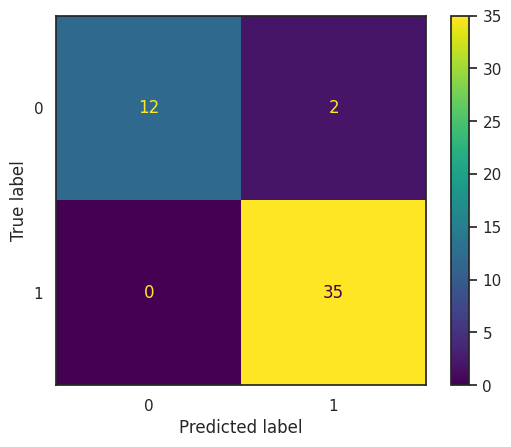

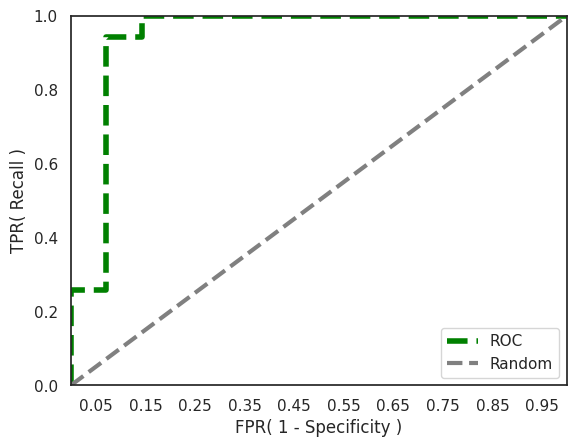

In [ ]:
if optuna_switch == True:
    lgb = LGBMClassifier(random_state=seed, **study_lgb.best_params)
else:
    lgb = LGBMClassifier(random_state=seed, max_depth=8, subsample=0.7685741440530103, colsample_bytree=0.33159946082189473, learning_rate = 0.262816149189883, min_child_weight = 7, reg_alpha = 2.4513434563232432, reg_lambda=2.758468600865858, n_estimators=1800, scale_pos_weight=1.0020536704974063)

lgb_model = lgb.fit(X_train, y_train)

pred = lgb_model.predict(X_valid)
pred_proba = lgb_model.predict_proba(X_valid)[:, 1]
metrics_train_lgb = get_clf_eval(y_valid.values, pred, pred_proba)

In [ ]:
# metrics_train_lgb

fig = go.Figure()

fig.add_trace(
    go.Table(
        columnwidth=[80,100],
        header=dict(values=['Metrics', 'LightGBM_Train'], height=50, font_size=22),
        cells=dict(
            values=[
                ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'ROC_AUC'],
                [
                    round(metrics_train_lgb['accuracy'], 3),
                    round(metrics_train_lgb['precision'], 3),
                    round(metrics_train_lgb['recall'], 3),
                    round(metrics_train_lgb['f1'], 3),
                    round(metrics_train_lgb['roc_auc'], 3)
                ]
            ],
            height=50,
            font_size=16
        )
    )
)

fig.show()

## Evaluate the Model

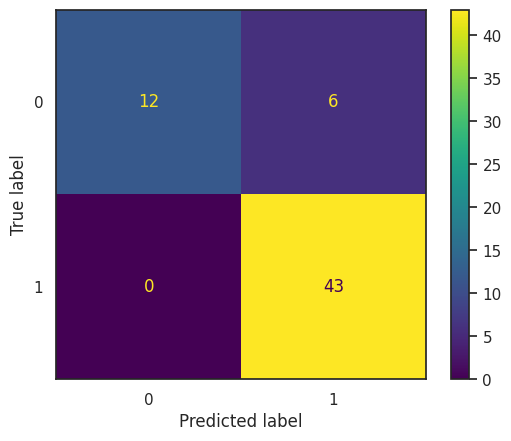

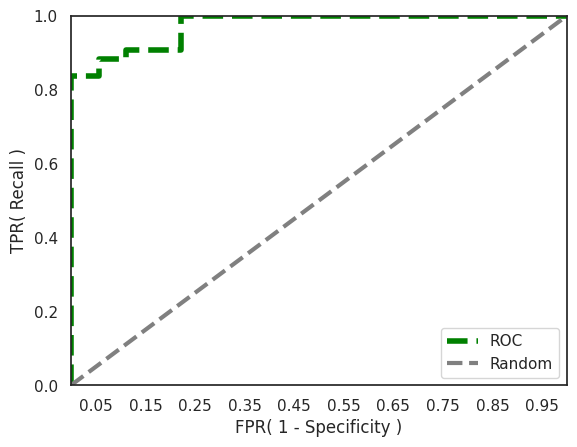

In [ ]:
pred = lgb_model.predict(X_test)
pred_proba = lgb_model.predict_proba(X_test)[:, 1]
metrics_test_lgb = get_clf_eval(y_test.values, pred, pred_proba)

In [ ]:
# metrics_test_lgb

fig = go.Figure()

fig.add_trace(
    go.Table(
        columnwidth=[80,100],
        header=dict(
            values=['Metrics', 'LightGBM_Test'],
            height=50,
            font_size=22
        ),
        cells=dict(
            values=[
                ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'ROC_AUC'],
                [
                    round(metrics_test_lgb['accuracy'], 3),
                    round(metrics_test_lgb['precision'], 3),
                    round(metrics_test_lgb['recall'], 3),
                    round(metrics_test_lgb['f1'], 3),
                    round(metrics_test_lgb['roc_auc'], 3)
                ]
            ],
            height=50,
            font_size=16
        )
    )
)

fig.show()

 Ensemble

## ***Ensemble1***

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier, RandomForestClassifier, BaggingClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.linear_model import RidgeClassifier, RidgeClassifierCV

In [ ]:
ABC = AdaBoostClassifier(random_state=seed)
BAG = BaggingClassifier(random_state=seed)
DTC = DecisionTreeClassifier(random_state=seed)
GB = GradientBoostingClassifier(random_state=seed)
LR = LogisticRegression(random_state=seed)
NB = GaussianNB()
RC = RidgeClassifier(random_state=seed)
RCC = RidgeClassifierCV()
RF = RandomForestClassifier(random_state=seed)
SVM_RBF = SVC(random_state=seed)

lr_final = LogisticRegression(random_state=seed)

In [ ]:
oversample = SMOTENC(random_state=seed, categorical_features=catord_cols)
X_train_en1, y_train_en1 = oversample.fit_resample(X_train_en, y_train_en)

ABC.fit(X_train_en1, y_train_en1)
BAG.fit(X_train_en1, y_train_en1)
RF.fit(X_train_en1, y_train_en1)
LR.fit(X_train_en1, y_train_en1)

cat_model.fit(X_train_en1, y_train_en1, cat_features=catord_cols)
xgb_model.fit(X_train_en1, y_train_en1)
lgb_model.fit(X_train_en1, y_train_en1)

ABC_pred = ABC.predict(X_test)
BAG_pred = BAG.predict(X_test)
RF_pred = RF.predict(X_test)
LR_pred = LR.predict(X_test)

cat_pred = cat_model.predict(X_test)
xgb_pred = xgb_model.predict(X_test)
lgb_pred = lgb_model.predict(X_test)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 173, number of negative: 173
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000159 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1393
[LightGBM] [Info] Number of data points in the train set: 346, number of used features: 37
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posi

In [ ]:
en_pred = np.array([ABC_pred, BAG_pred, RF_pred, LR_pred, cat_pred, xgb_pred, lgb_pred])
en_pred.shape

(7, 61)

In [ ]:
en_pred = np.transpose(en_pred)
en_pred.shape

(61, 7)

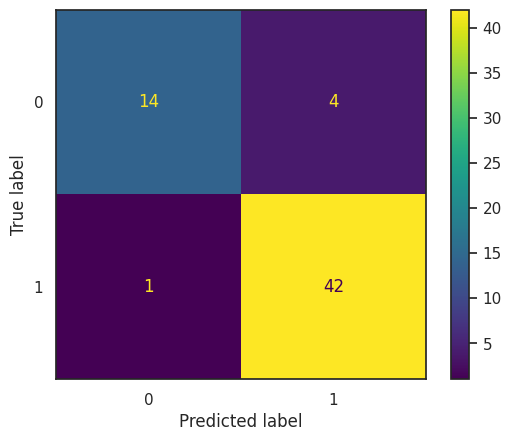

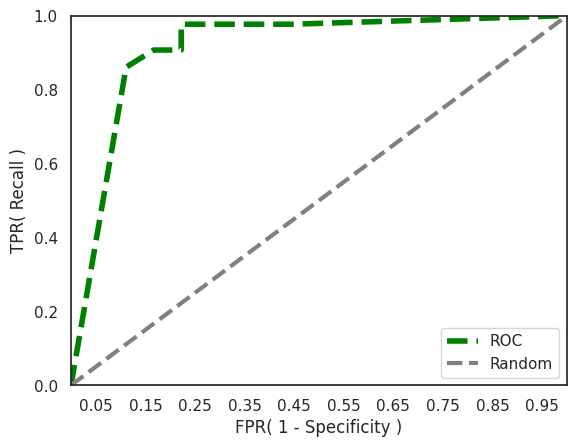

In [ ]:
lr_final.fit(en_pred, y_test)
final = lr_final.predict(en_pred)
pred_proba = lr_final.predict_proba(en_pred)[:,1]
metrics_test_en1 = get_clf_eval(y_test.values, final, pred_proba)

In [ ]:
# metrics_test_en1

fig = go.Figure()

fig.add_trace(
    go.Table(
        columnwidth=[80,100],
        header=dict(
            values=['Metrics', 'Ensemble1_Test'],
            height=50,
            font_size=22
        ),
        cells=dict(
            values=[
                ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'ROC_AUC'],
                [
                    round(metrics_test_en1['accuracy'], 3),
                    round(metrics_test_en1['precision'], 3),
                    round(metrics_test_en1['recall'], 3),
                    round(metrics_test_en1['f1'], 3),
                    round(metrics_test_en1['roc_auc'], 3)
                ]
            ],
            height=50,
            font_size=16
        )
    )
)

fig.show()

## ***Ensemble2***

In [ ]:
from sklearn.model_selection import StratifiedKFold, KFold

def get_stacking_base_datasets(model, X_train_n, y_train_n, X_test_n, n_folds):

    skf = StratifiedKFold(n_splits = n_folds, shuffle=False)
    train_fold_pred = np.zeros((X_train_n.shape[0], 1))
    test_pred = np.zeros((X_test_n.shape[0], n_folds))
    Xy_concat = pd.concat([X_train_n, pd.DataFrame(data=y_train_n, columns=['Cath'])], axis=1)

    for i, (train_index, valid_index) in enumerate(skf.split(Xy_concat, Xy_concat['Cath'])):
        X_tr = X_train_n.iloc[train_index]
        y_tr = y_train_n.iloc[train_index]

        oversample = SMOTENC(random_state=seed, categorical_features=catord_cols)
        X_tr, y_tr = oversample.fit_resample(X_tr, y_tr)

        X_te = X_train_n.iloc[valid_index]

        model.fit(X_tr, y_tr)

        train_fold_pred[valid_index, :] = model.predict(X_te).reshape(-1, 1)

        test_pred[:, i] = model.predict(X_test_n)

    test_pred_mean = np.mean(test_pred, axis=1).reshape(-1, 1)

    return train_fold_pred, test_pred_mean

In [ ]:
cat_train, cat_test = get_stacking_base_datasets(cat_model, X_train_en, y_train_en, X_test, 7)
xgb_train, xgb_test = get_stacking_base_datasets(xgb_model, X_train_en, y_train_en, X_test, 7)
lgb_train, lgb_test = get_stacking_base_datasets(lgb_model, X_train_en, y_train_en, X_test, 7)

Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there ar

In [ ]:
Stack_final_X_train = np.concatenate((cat_train, xgb_train, lgb_train), axis=1)
Stack_final_X_test = np.concatenate((cat_test, xgb_test, lgb_test), axis=1)

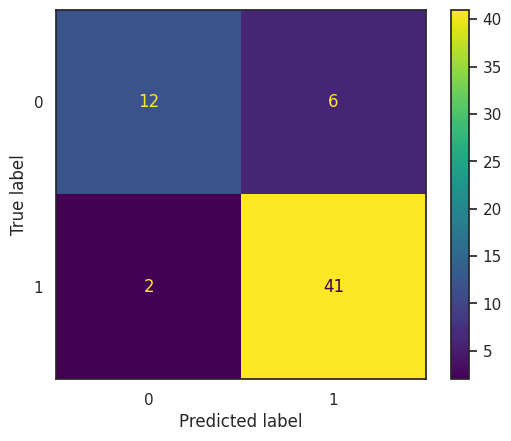

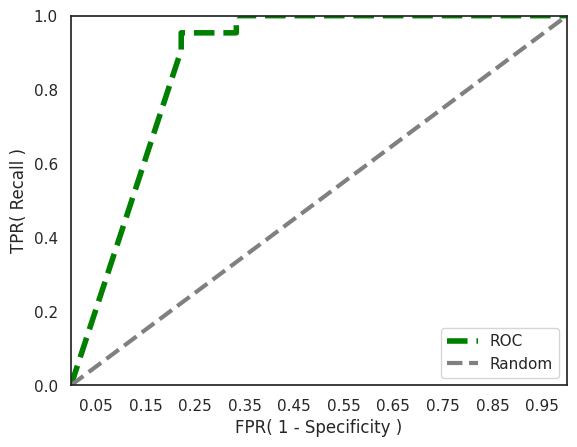

In [ ]:
lr_final = LogisticRegression(random_state=seed)
lr_final.fit(Stack_final_X_train, y_train_en)
stack_final = lr_final.predict(Stack_final_X_test)
pred_proba = lr_final.predict_proba(Stack_final_X_test)[:,1]
metrics_test_en2 = get_clf_eval(y_test.values, stack_final, pred_proba)

In [ ]:
# Check metrics_test_en2

print(type(metrics_test_en2))
print(metrics_test_en2)
fig = go.Figure()

fig.add_trace(
    go.Table(
        columnwidth=[80, 100],
        header=dict(
            values=['Metrics', 'Ensemble2_Test'],
            height=50,
            font_size=22
        ),
        cells=dict(
            values=[
                ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'ROC_AUC'],
                [
                    round(metrics_test_en2['accuracy'], 3),
                    round(metrics_test_en2['precision'], 3),
                    round(metrics_test_en2['recall'], 3),
                    round(metrics_test_en2['f1'], 3),
                    round(metrics_test_en2['roc_auc'], 3)
                ]
            ],
            height=50,
            font_size=16
        )
    )
)

fig.show()

<class 'dict'>
{'accuracy': 0.8688524590163934, 'precision': 0.8723404255319149, 'recall': 0.9534883720930233, 'f1': 0.9111111111111111, 'roc_auc': np.float64(0.8733850129198967)}


## ***Ensemble3***

In [ ]:
score_list = pd.DataFrame()

#oversample = SMOTENC(random_state=seed, categorical_features=catord_cols)
#X_train_en3, y_train_en3 = oversample.fit_resample(X_train_en, y_train_en)

pred_cat = cat_model.predict_proba(X_valid)
pred_cat = [i[1] for i in pred_cat]
score_list['cat'] = pred_cat

pred_xgb = xgb_model.predict_proba(X_valid)
pred_xgb = [i[1] for i in pred_xgb]
score_list['xgb'] = pred_xgb

pred_lgb = lgb_model.predict_proba(X_valid)
pred_lgb = [i[1] for i in pred_lgb]
score_list['lgb'] = pred_lgb

add_model = [ABC, BAG, LR, RF]
add_model_name = ['ABC', 'BAG', 'LR', 'RF']

for addmodel, modelname in zip(add_model, add_model_name):
    x = addmodel.predict_proba(X_valid)
    x = [i[1] for i in x]
    score_list[modelname] = x

In [ ]:
score_list.head()

,cat,xgb,lgb,ABC,BAG,LR,RF
0,0.004500,0.018105,0.037583,0.380729,0.2,0.073031,0.09
1,0.029370,0.064857,0.075884,0.386219,0.3,0.180974,0.23
2,0.998608,0.995682,0.991540,0.681483,1.0,0.999691,0.96
3,0.026590,0.095593,0.097582,0.440941,0.2,0.106403,0.18
4,0.969308,0.938110,0.869144,0.543395,0.9,0.540740,0.94


In [ ]:
from sklearn.ensemble import VotingClassifier

weights = LogisticRegression(random_state=seed).fit(score_list, y_valid).coef_[0]

In [ ]:
pd.DataFrame(weights, index = score_list.columns, columns = ['weight per model'])

,weight per model
cat,1.017041
xgb,0.915928
lgb,0.764791
ABC,0.259721
BAG,1.341475
LR,0.805580
RF,1.302478


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 138, number of negative: 55
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000128 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 749
[LightGBM] [Info] Number of data points in the train set: 193, number of used features: 37
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.715026 -> initscore=0.919920
[LightGBM] [Info] Start training from score 0.919920
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

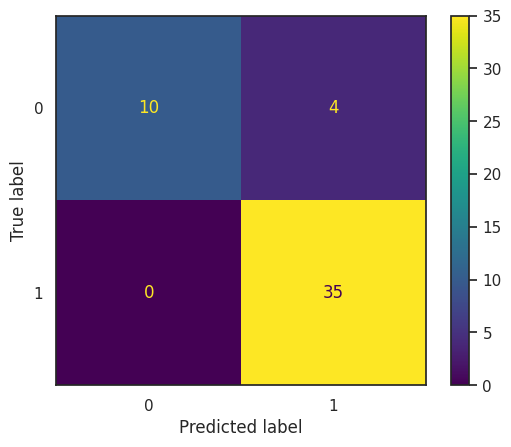

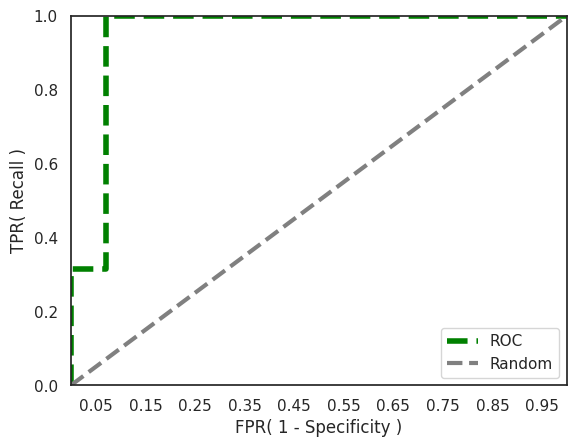

In [ ]:
from sklearn.ensemble import VotingClassifier
models = [('cat', cat_model), ('xgb', xgb_model), ('lgb', lgb_model), ('ABC', ABC), ('BAG', BAG), ('LR', LR), ('RF', RF)]
VTC = VotingClassifier(models, weights=weights, voting='soft')
VTC.fit(X_train, y_train)

pred = VTC.predict(X_valid)
pred_proba = VTC.predict_proba(X_valid)[:, 1]
metrics_train_en3 = get_clf_eval(y_valid.values, pred, pred_proba)

In [ ]:
# metrics_train_en3

fig = go.Figure()

fig.add_trace(
    go.Table(
        columnwidth=[80, 100],
        header=dict(
            values=['Metrics', 'Ensemble3_Train'],
            height=50,
            font_size=22
        ),
        cells=dict(
            values=[
                ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'ROC_AUC'],
                [
                    round(metrics_train_en3['accuracy'], 3),
                    round(metrics_train_en3['precision'], 3),
                    round(metrics_train_en3['recall'], 3),
                    round(metrics_train_en3['f1'], 3),
                    round(metrics_train_en3['roc_auc'], 3)
                ]
            ],
            height=50,
            font_size=16
        )
    )
)

fig.show()

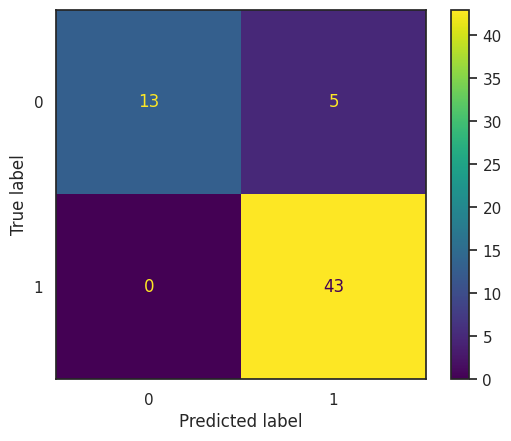

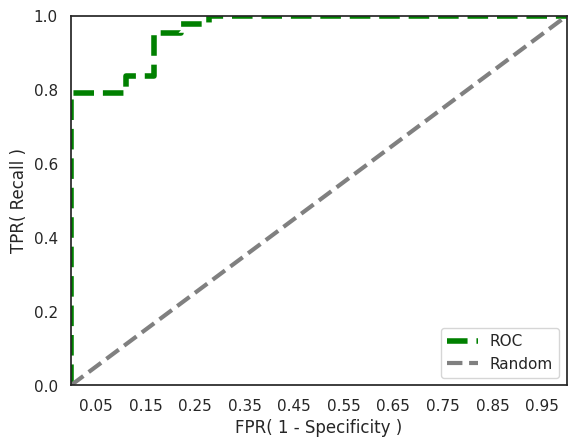

In [ ]:
pred = VTC.predict(X_test)
pred_proba = VTC.predict_proba(X_test)[:, 1]
metrics_test_en3 = get_clf_eval(y_test.values, pred, pred_proba)

In [ ]:
# metrics_test_en3

fig = go.Figure()

fig.add_trace(
    go.Table(
        columnwidth=[80, 100],
        header=dict(
            values=['Metrics', 'Ensemble3_Test'],
            height=50,
            font_size=22
        ),
        cells=dict(
            values=[
                ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'ROC_AUC'],
                [
                    round(metrics_test_en3['accuracy'], 3),
                    round(metrics_test_en3['precision'], 3),
                    round(metrics_test_en3['recall'], 3),
                    round(metrics_test_en3['f1'], 3),
                    round(metrics_test_en3['roc_auc'], 3)
                ]
            ],
            height=50,
            font_size=16
        )
    )
)

fig.show()

Compare Different Models

Text(0.5, 1.0, 'Metrics')

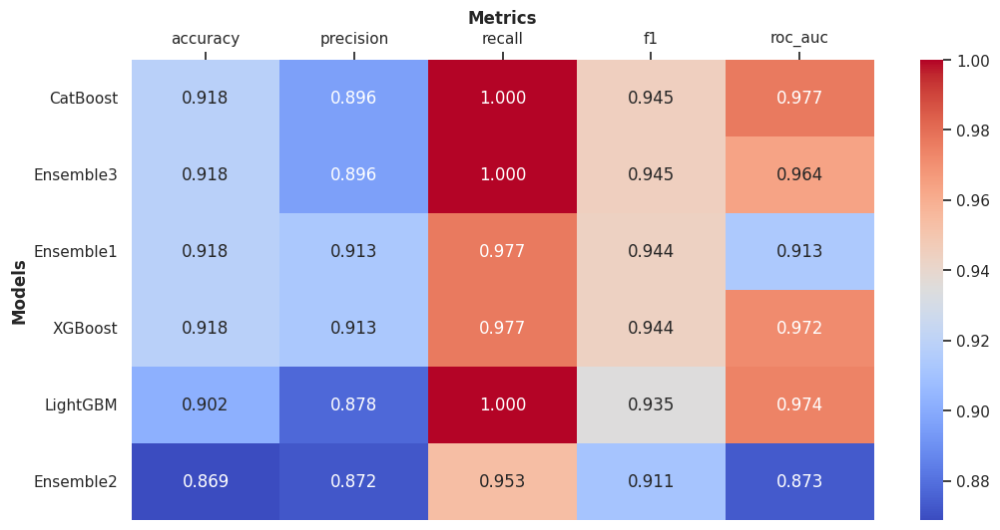

In [ ]:
models_name = {'XGBoost': metrics_test_xgb, 'LightGBM': metrics_test_lgb, 'CatBoost': metrics_test_cb, 'Ensemble1': metrics_test_en1, 'Ensemble2': metrics_test_en2, 'Ensemble3': metrics_test_en3}

df_test_metrics = pd.DataFrame.from_dict(models_name, orient='index')
df_test_metrics = df_test_metrics.sort_values('recall', ascending=False).sort_values('f1', ascending=False)

fig, ax = plt.subplots(figsize=(12,6))
sns.heatmap(df_test_metrics, annot=True, cmap='coolwarm', fmt=".3f", ax=ax)
ax.xaxis.tick_top()
ax.set_ylabel('Models', fontsize=12, fontweight='bold')
ax.set_title('Metrics', fontsize=12, fontweight='bold')

# ** Explainable AI using SHAP value**

In [ ]:
cat_explainer = shap.TreeExplainer(cat_model, X_train, feature_names = X_train.columns.tolist())
shap_values = cat_explainer.shap_values(X_train, y_train)
shap_values.shape

(193, 53)

In [ ]:
pd.DataFrame(shap_values, columns=X_train.columns.tolist()).head()

,Sex_Male,DM_1,HTN_1,Current Smoker_1,EX-Smoker_1,FH_1,Obesity_1,CRF_1,CVA_1,Airway disease_1,...,K,Na,WBC,Lymph,Neut,PLT,EF-TTE,Function Class,Region RWMA,VHD
0,0.108810,-0.202689,0.249442,-0.155950,0.000103,-0.092685,-0.032478,0.0,-0.000761,-0.002612,...,0.397741,0.070525,0.031836,0.069242,0.171437,-0.087620,0.352806,-0.163654,-0.213173,0.364908
1,0.065907,-0.171970,-0.267807,0.638678,-0.001128,0.345817,-0.027606,0.0,0.000272,0.000280,...,-0.165611,0.357405,0.325698,0.055578,0.257083,0.047436,-0.949866,-0.165761,0.582508,0.257375
2,0.058804,-0.162011,0.183088,-0.125054,0.001198,-0.072712,0.025873,0.0,-0.000353,-0.000319,...,-0.040603,0.319157,-0.350679,0.038251,0.058942,-0.023994,0.614515,0.294974,0.469350,-0.176663
3,-0.086104,-0.184836,0.167304,0.546736,-0.000198,-0.058738,-0.026768,0.0,-0.000043,0.001400,...,0.007749,-0.144417,-0.117165,-0.027471,-0.227088,-0.099631,-1.042996,-0.179575,-0.148271,0.315275
4,-0.176944,-0.229592,-0.333148,-0.156206,-0.000500,-0.091666,-0.032031,0.0,-0.000816,-0.002446,...,-0.267338,-0.316849,0.074011,-0.095127,-0.135405,-0.281579,-1.089502,-0.175992,-0.193007,0.262594


In [ ]:
pd.DataFrame(pd.DataFrame(shap_values, columns=X_train.columns.tolist()).abs().sum().sort_values(ascending=False), columns=["sum(|SHAP value|)"])

,sum(|SHAP value|)
Typical Chest Pain_1,285.846863
EF-TTE,123.154258
Age,111.413782
Atypical_1,79.303390
FBS,76.644747
TG,73.169619
ESR,64.452106
CR,63.121385
BP,57.381475
Tinversion_1,56.073644


# ***Global Interpretability***

 SHAP Feature Importance Plot

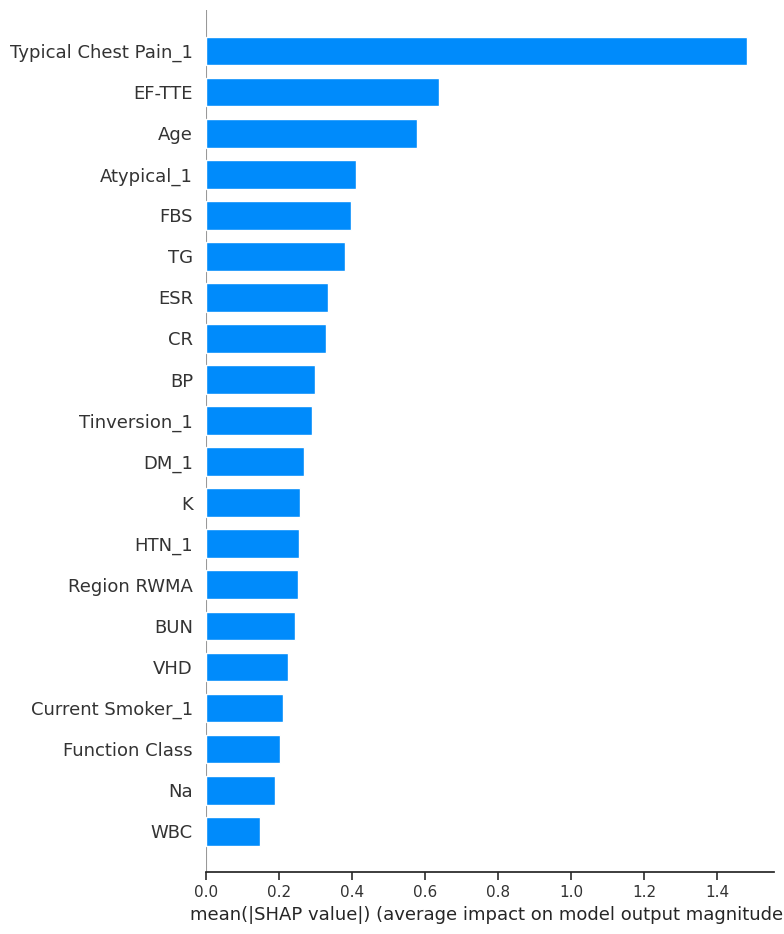

In [ ]:
shap.summary_plot(shap_values, X_train, feature_names=X_train.columns, plot_type="bar")

 SHAP Beeswarm Plot

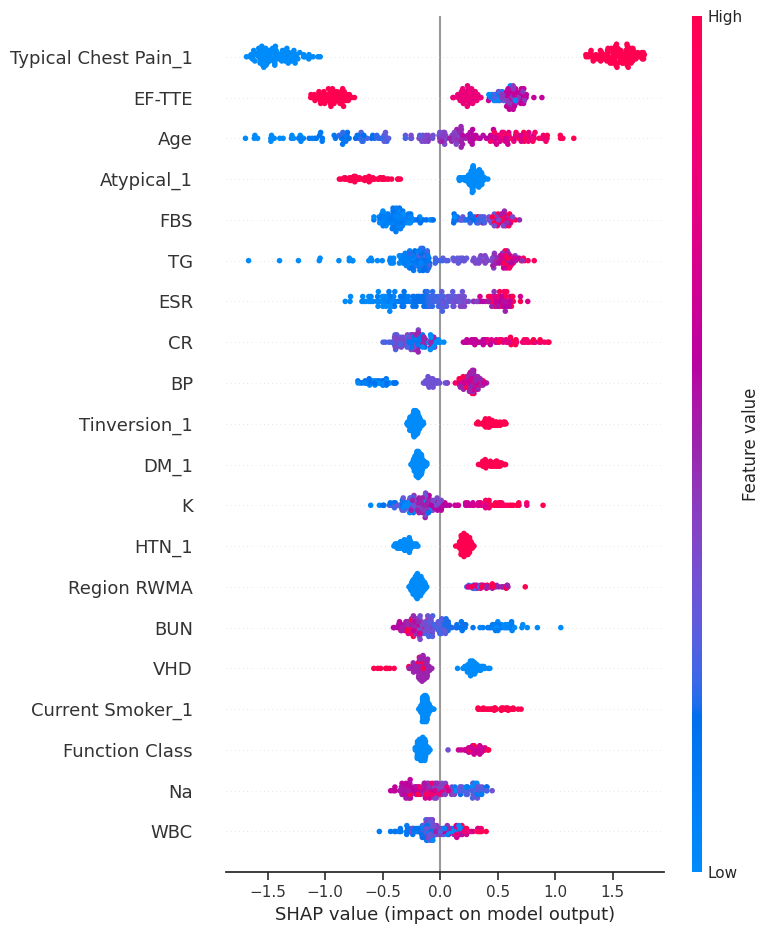

In [ ]:
shap.summary_plot(shap_values, X_train, feature_names=X_train.columns)

 SHAP Dependence Plot

## Numerical Features

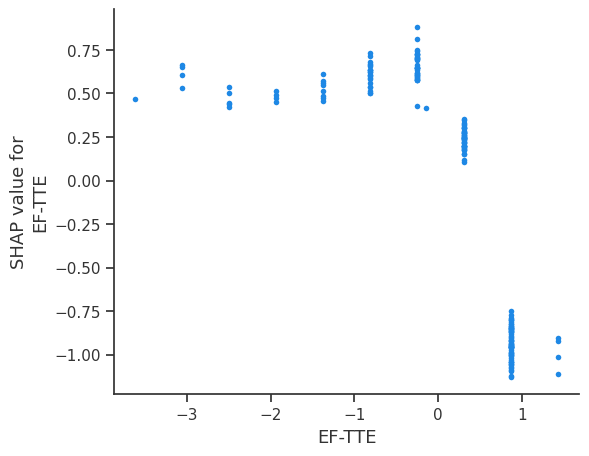

In [ ]:
shap.dependence_plot("EF-TTE", shap_values, X_train, interaction_index=None)

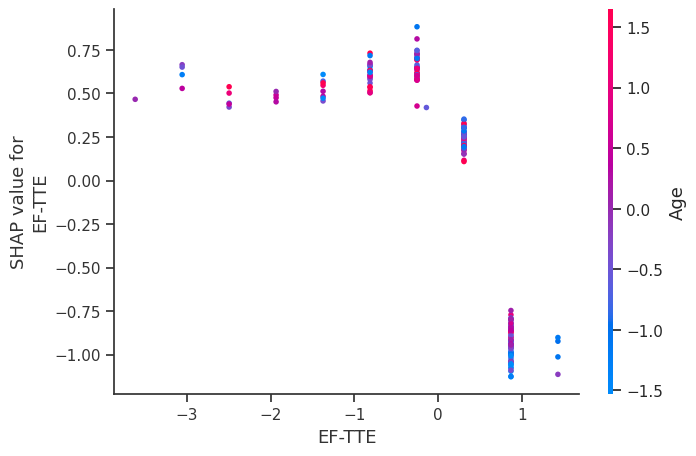

In [ ]:
shap.dependence_plot("EF-TTE", shap_values, X_train, interaction_index='auto')

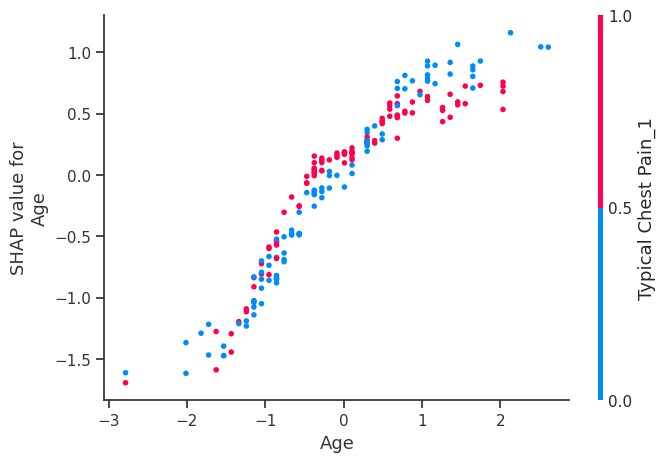

In [ ]:
shap.dependence_plot("Age", shap_values, X_train, interaction_index='auto')

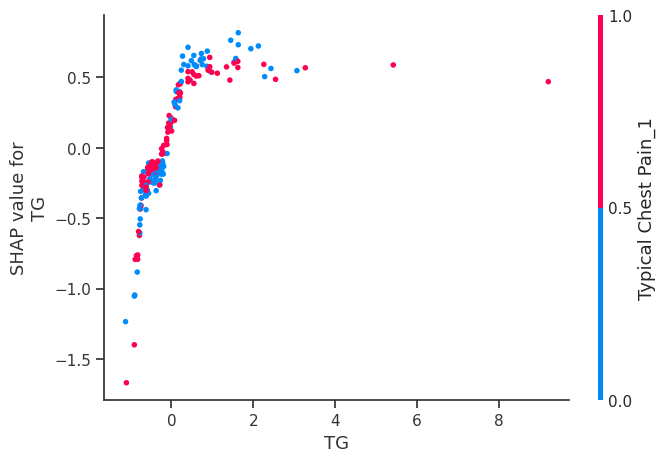

In [ ]:
shap.dependence_plot("TG", shap_values, X_train, interaction_index='auto')

## Categorical Features

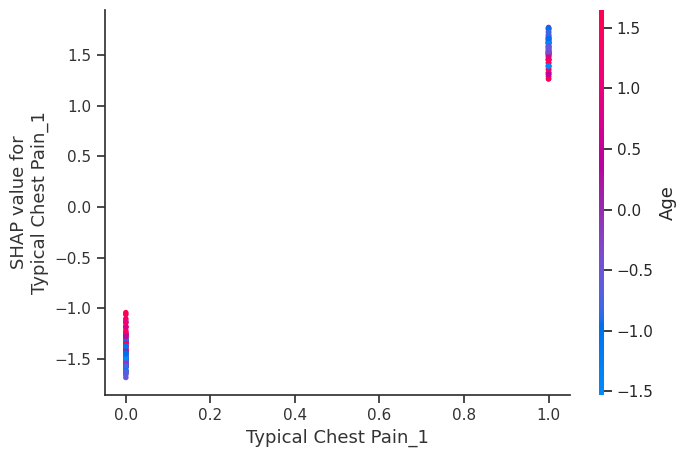

In [ ]:
shap.dependence_plot("Typical Chest Pain_1", shap_values, X_train, interaction_index='auto')

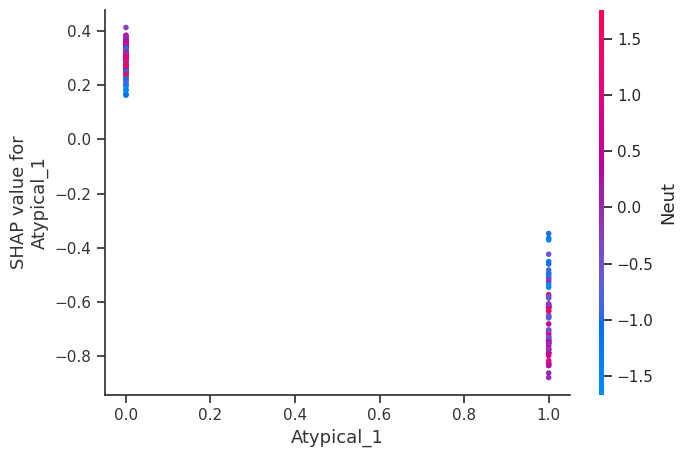

In [ ]:
shap.dependence_plot("Atypical_1", shap_values, X_train, interaction_index='auto')

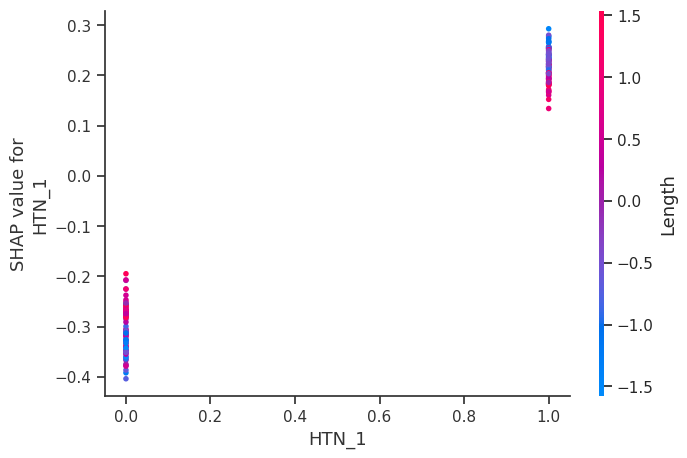

In [ ]:
shap.dependence_plot("HTN_1", shap_values, X_train, interaction_index='auto')

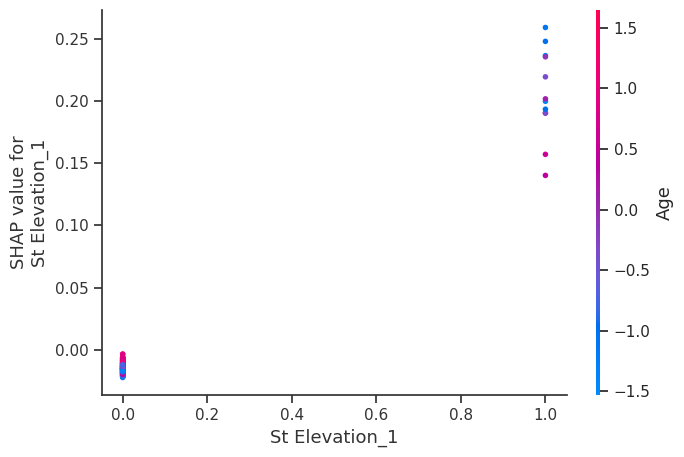

In [ ]:
shap.dependence_plot("St Elevation_1", shap_values, X_train, interaction_index='auto')

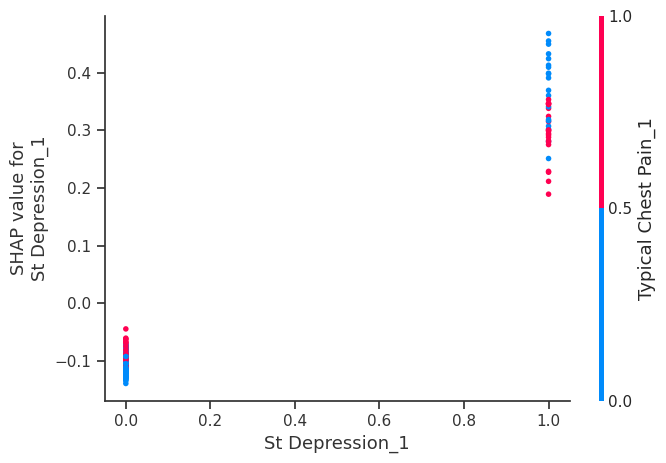

In [ ]:
shap.dependence_plot("St Depression_1", shap_values, X_train, interaction_index='auto')

## Ordinal Features

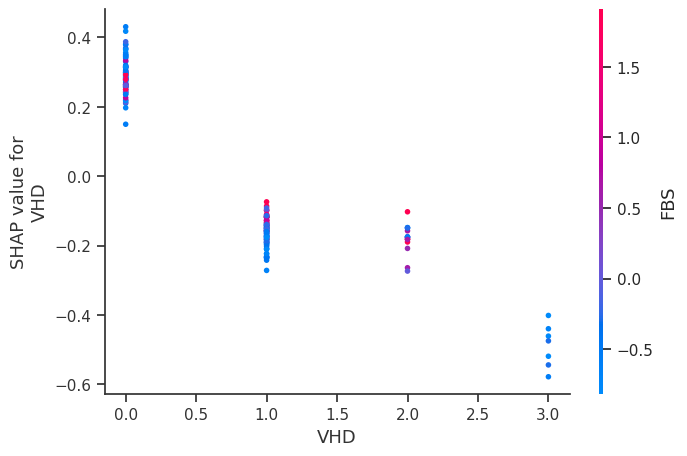

In [ ]:
shap.dependence_plot("VHD", shap_values, X_train, interaction_index="auto")

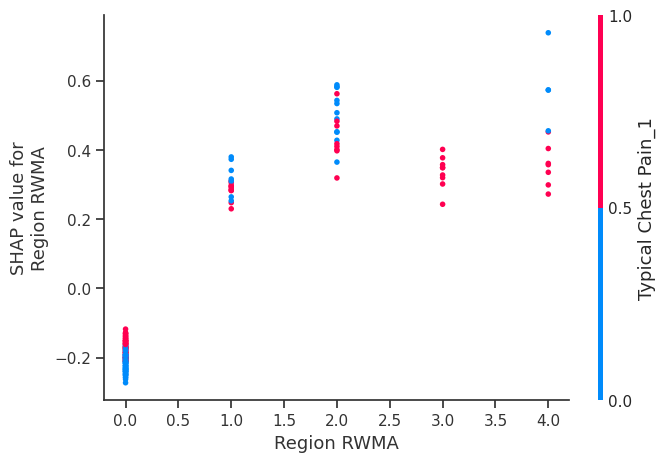

In [ ]:
shap.dependence_plot("Region RWMA", shap_values, X_train, interaction_index="auto")

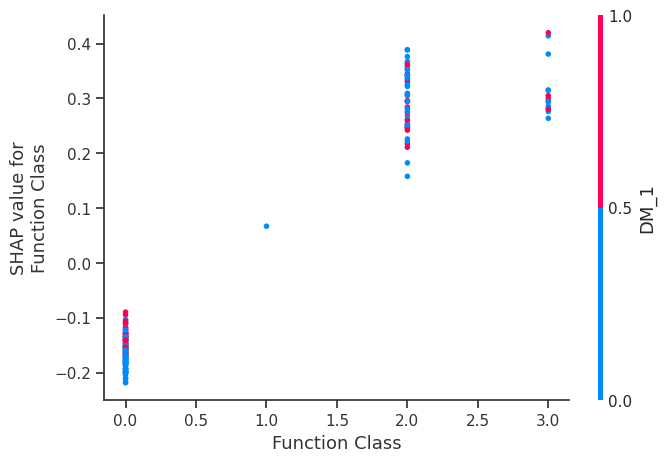

In [ ]:
shap.dependence_plot("Function Class", shap_values, X_train, interaction_index="auto")

# ***Local Interpretability***

SHAP Waterfall Plot & Force Plot

In [ ]:
cat_explainer = shap.TreeExplainer(cat_model, X_train, feature_names = X_train.columns.tolist())

In [ ]:
shap_explainer_values = cat_explainer(X_train, y_train)

In [ ]:
type(shap_explainer_values)

shap._explanation.Explanation

## ***Patient No.77***

In [ ]:
pd.DataFrame(X_train.iloc[77])

,236
Sex_Male,1.000000
DM_1,1.000000
HTN_1,1.000000
Current Smoker_1,0.000000
EX-Smoker_1,0.000000
FH_1,1.000000
Obesity_1,0.000000
CRF_1,0.000000
CVA_1,0.000000
Airway disease_1,0.000000


In [ ]:
pd.DataFrame(data.iloc[236])

,236
Age,47
Weight,66
Length,170
Sex,Male
BMI,22.83737
DM,1
HTN,1
Current Smoker,0
EX-Smoker,0
FH,1


In [ ]:
cat_model.predict_proba(X_train.iloc[77])[1]*100

np.float64(98.6544885285057)

Catboost model predicted the probability of coronary artery disease as 98.7%.

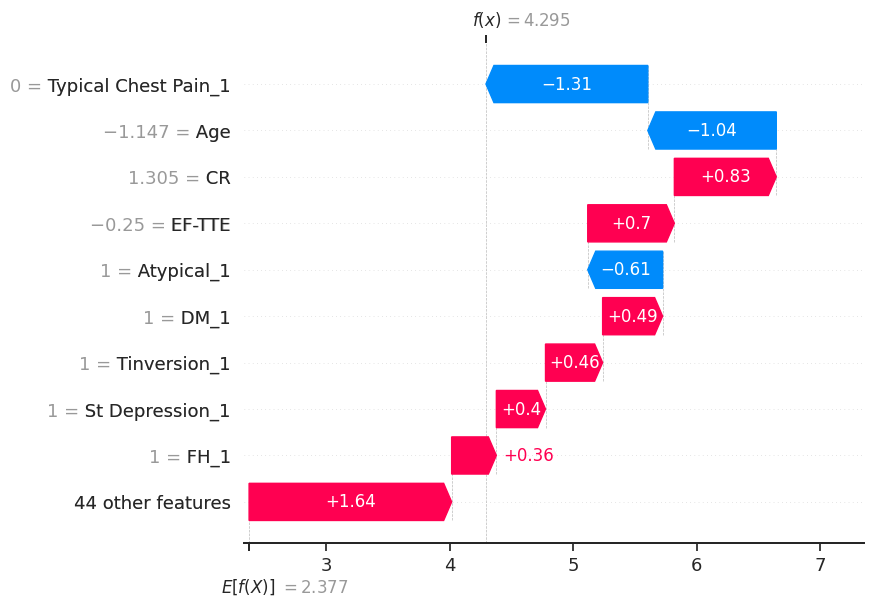

In [ ]:
shap.waterfall_plot(shap_explainer_values[77])

In [ ]:
shap.initjs()

shap.force_plot(shap_explainer_values[77])

## ***Patient No.7***

In [ ]:
pd.DataFrame(X_train.iloc[7])

,204
Sex_Male,0.000000
DM_1,0.000000
HTN_1,0.000000
Current Smoker_1,0.000000
EX-Smoker_1,0.000000
FH_1,1.000000
Obesity_1,1.000000
CRF_1,0.000000
CVA_1,0.000000
Airway disease_1,0.000000


In [ ]:
pd.DataFrame(data.iloc[204])

,204
Age,50
Weight,89
Length,159
Sex,Female
BMI,35.204304
DM,0
HTN,0
Current Smoker,0
EX-Smoker,0
FH,1


In [ ]:
cat_model.predict_proba(X_train.iloc[7])[1]*100

np.float64(9.677012921467963)

Catboost model predicted the probability of coronary artery disease as 7.4%.

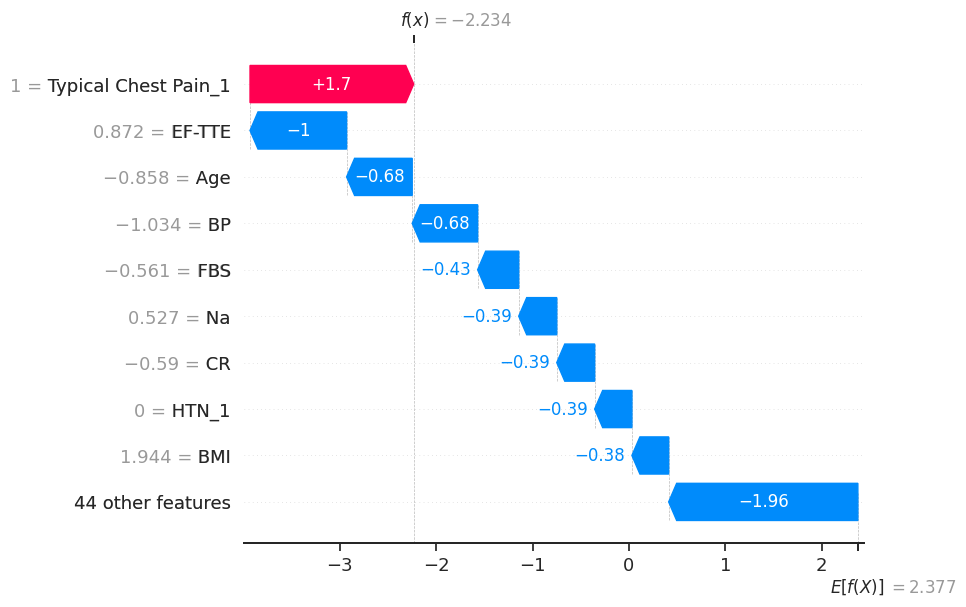

In [ ]:
shap.waterfall_plot(shap_explainer_values[7])

In [ ]:
shap.initjs()

shap.force_plot(shap_explainer_values[7])

New Patient Prediction

In [ ]:
# ============================================================
# STEP 1 - ENTER NEW PATIENT DETAILS INTERACTIVELY
# Reuses the same raw feature names as `X.columns` (Section 3.2).
# No values are hardcoded - everything is typed in at runtime.
# ============================================================

def ask_float(prompt):
    while True:
        val = input(prompt)
        try:
            return float(val)
        except ValueError:
            print("  Please enter a numeric value.")

def ask_binary(prompt):
    while True:
        val = input(prompt + " (0 = No, 1 = Yes): ").strip()
        if val in ('0', '1'):
            return int(val)
        print("  Please enter 0 or 1.")

def ask_sex(prompt):
    while True:
        val = input(prompt + " (Male/Female): ").strip().capitalize()
        if val in ('Male', 'Female'):
            return val
        print("  Please enter 'Male' or 'Female'.")

def ask_choice(prompt, choices):
    choice_str = "/".join(f"{k}={v}" for k, v in choices.items())
    while True:
        val = input(f"{prompt} ({choice_str}): ").strip()
        if val in choices:
            return int(val)
        print(f"  Please enter one of: {list(choices.keys())}")

print("=" * 60)
print("ENTER NEW PATIENT DETAILS")
print("=" * 60)

new_patient_raw = {}

print("\n--- Demographics ---")
new_patient_raw['Age']    = ask_float("Age (years): ")
new_patient_raw['Weight'] = ask_float("Weight (kg): ")
new_patient_raw['Length'] = ask_float("Length / Height (cm): ")
new_patient_raw['Sex']    = ask_sex("Sex")
new_patient_raw['BMI']    = ask_float("BMI (kg/m^2): ")

print("\n--- Underlying Disease ---")
for feat in ['DM', 'HTN', 'Current Smoker', 'EX-Smoker', 'FH', 'Obesity',
             'CRF', 'CVA', 'Airway disease', 'Thyroid Disease', 'CHF', 'DLP']:
    new_patient_raw[feat] = ask_binary(feat)

print("\n--- Vitals / Labs ---")
for feat in ['BP', 'PR', 'FBS', 'CR', 'TG', 'LDL', 'HDL', 'BUN', 'ESR',
             'HB', 'K', 'Na', 'WBC', 'Lymph', 'Neut', 'PLT']:
    new_patient_raw[feat] = ask_float(f"{feat}: ")

print("\n--- Physical Exam ---")
for feat in ['Edema', 'Weak Peripheral Pulse', 'Lung rales',
             'Systolic Murmur', 'Diastolic Murmur']:
    new_patient_raw[feat] = ask_binary(feat)

print("\n--- Symptoms ---")
for feat in ['Typical Chest Pain', 'Dyspnea', 'Atypical', 'Nonanginal',
             'Exertional CP', 'LowTH Ang']:
    new_patient_raw[feat] = ask_binary(feat)

print("\n--- ECG ---")
for feat in ['Q Wave', 'St Elevation', 'St Depression', 'Tinversion',
             'LVH', 'Poor R Progression']:
    new_patient_raw[feat] = ask_binary(feat)

print("\n--- Echocardiography ---")
new_patient_raw['Function Class'] = ask_choice("Function Class", {'0': 'NYHA I', '1': 'NYHA II', '2': 'NYHA III', '3': 'NYHA IV'})
new_patient_raw['Region RWMA']    = ask_choice("Region RWMA", {'0': '0', '1': '1', '2': '2', '3': '3', '4': '4'})
new_patient_raw['VHD']            = ask_choice("VHD", {'0': 'N', '1': 'mild', '2': 'Moderate', '3': 'Severe'})
new_patient_raw['EF-TTE']         = ask_float("EF-TTE / Ejection Fraction (%): ")

# Build a single-row DataFrame with the exact same raw columns (name & order)
# as the training features `X` (created earlier in Section 3.2).
new_patient_df = pd.DataFrame([new_patient_raw])[X.columns]

print("\nAll patient details entered.")

ENTER NEW PATIENT DETAILS

--- Demographics ---
Age (years): 18
Weight (kg): 45
Length / Height (cm): 155
Sex (Male/Female): Male
BMI (kg/m^2): 24.90

--- Underlying Disease ---
DM (0 = No, 1 = Yes): 0
HTN (0 = No, 1 = Yes): 1
Current Smoker (0 = No, 1 = Yes): 0
EX-Smoker (0 = No, 1 = Yes): 0
FH (0 = No, 1 = Yes): 0
Obesity (0 = No, 1 = Yes): 0
CRF (0 = No, 1 = Yes): 0
CVA (0 = No, 1 = Yes): 0
Airway disease (0 = No, 1 = Yes): 0
Thyroid Disease (0 = No, 1 = Yes): 0
CHF (0 = No, 1 = Yes): 0
DLP (0 = No, 1 = Yes): 0

--- Vitals / Labs ---
BP: 120
PR: 78
FBS: 0
CR: 0
TG: 15.0
LDL: 110
HDL: 45
BUN: 18
ESR: 12
HB: 14
K: 4.2
Na: 140
WBC: 7000
Lymph: 30
Neut: 60
PLT: 250000

--- Physical Exam ---
Edema (0 = No, 1 = Yes): 60
  Please enter 0 or 1.
Edema (0 = No, 1 = Yes): 1
Weak Peripheral Pulse (0 = No, 1 = Yes): 0
Lung rales (0 = No, 1 = Yes): 0
Systolic Murmur (0 = No, 1 = Yes): 0
Diastolic Murmur (0 = No, 1 = Yes): 0

--- Symptoms ---
Typical Chest Pain (0 = No, 1 = Yes): 0
Dyspnea (0 = No

In [ ]:
# Display the entered patient details in the same formatted table style
# used for Patient No.77 (pd.DataFrame(data.iloc[236]))
pd.DataFrame(new_patient_df.iloc[0])

,0
Age,18.0
Weight,45.0
Length,155.0
Sex,Male
BMI,24.9
DM,0
HTN,1
Current Smoker,0
EX-Smoker,0
FH,0


In [ ]:
# STEP 2 - Preprocess using the SAME fitted `preprocessor` (no re-fitting)
new_patient_prep = preprocessor.transform(new_patient_df)
new_patient_prep = new_patient_prep[X_train.columns]
new_patient_prep

,Sex_Male,DM_1,HTN_1,Current Smoker_1,EX-Smoker_1,FH_1,Obesity_1,CRF_1,CVA_1,Airway disease_1,...,K,Na,WBC,Lymph,Neut,PLT,EF-TTE,Function Class,Region RWMA,VHD
0,1,0,1,0,0,0,0,0,0,0,...,-0.067097,-0.262179,-0.025748,-0.04011,-0.21135,0.469745,0.310686,1,0,0


In [ ]:
# STEP 3 - Predict using the SAME trained CatBoost model (no retraining)
new_patient_pred = cat_model.predict(new_patient_prep)[0]
new_patient_pred_proba = cat_model.predict_proba(new_patient_prep)[:, 1][0] * 100

diagnosis = "Cad (Coronary Artery Disease Present)" if new_patient_pred == 1 else "Normal (No Coronary Artery Disease)"

print(f"Heart Disease Prediction : {diagnosis}")
print(f"Prediction Probability   : {new_patient_pred_proba:.1f}%")

Heart Disease Prediction : Cad (Coronary Artery Disease Present)
Prediction Probability   : 99.5%


In [ ]:
# STEP 4 - Explain using the SAME SHAP TreeExplainer (no new explainer)
new_patient_shap_values = cat_explainer(new_patient_prep, np.array([new_patient_pred]))
type(new_patient_shap_values)

shap._explanation.Explanation

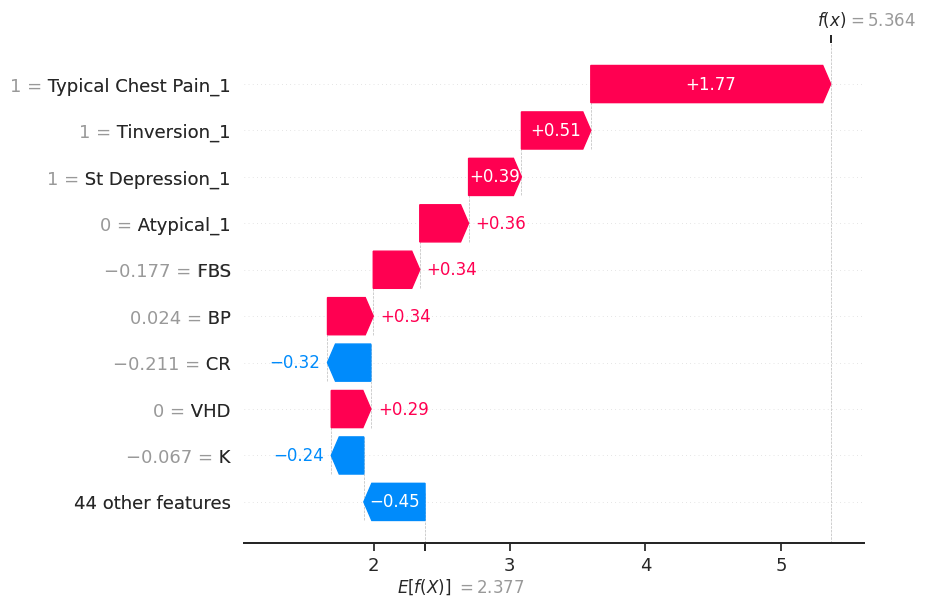

In [ ]:
shap.waterfall_plot(new_patient_shap_values[0])

In [ ]:
shap.initjs()
shap.force_plot(new_patient_shap_values[0])